# base_v3-Copy3.ipynb

The versio of base_v3.ipynb.with only tension afferent connections in AF__M.

In [1]:
%cd ../..
import numpy as np
import matplotlib.pyplot as plt
import time

/home/z/projects/draculab


In [2]:
%load_ext Cython

In [3]:
%%cython
from draculab import *

In [3]:
corr_type=None
if corr_type is None:
    print('It was none')

It was none


In [4]:
##################################
####### Create the network #######
##################################

# simulation control parameters
t_pres = 25. # number of seconds to hold each set of target lengths
rand_w = False # whether to use random weights in M->C, AF->M

# First the network object, the plant, the list of coordinates
net_params = {'min_delay' : 0.005,
              'min_buff_size' : 10 }
P_params = {  'type' : plant_models.bouncy_planar_arm_v3,
          'mass1': 1.,
          'mass2': 1.,
          's_min' : -0.4,
          'p1' : (-0.01, 0.04),
          'p2' : (0.29, 0.03),
          'p3' : (0., 0.05),
          'p5' : (0.01, -0.05),
          'p10': (0.29, 0.03),
          'init_q1': 0.,
          'init_q2': np.pi/2.,
          'init_q1p': 0.,
          'init_q2p': 0.,
          'g': 0.0,
          'mu1': 1.,
          'mu2': 1.,
          'l_torque' : 0.01,
          'l_visco' : 0.01,
          'g_e' : 20.,
          'l0_e' : [1.]*6,
          'Ia_gain' : 2.5*np.array([3.,10.,10., 3.,10.,10.]),
          'II_gain' : 2.*np.array([3., 8., 8., 3., 8., 8.]),
          'Ib_gain' : 1.,
          'T_0' : 10.,
          'k_pe_e' : 2.,  #8
          'k_se_e' : 20., #13
          'b_e' : 5.,
          'g_s' : 0.02,
          'k_pe_s' : 2., 
          'k_se_s' : 2.,
          'g_d' : 0.01,
          'k_pe_d' : .2, #.1,
          'k_se_d' : 1., #2.,
          'b_s' : .5,
          'b_d' : 2.,#3.,
          'l0_s': .7,
          'l0_d': .8,
          'fs' : 0.1,
          'se_II' : 0.5,
          'cd' : 0.5,
          'cs' : 0.5,
          'tau' : 0.1   # ficticious time constant used in create_freqs_steps
           }
net = network(net_params)
P = net.create(1, P_params)
arm = net.plants[P]

# We organize the spinal connections through 4 types of symmetric relations
# these lists are used to set intraspinal connections and test connection matrices
antagonists = [(0,3), (1,2), (4,5)]
part_antag = [(0,2),(0,5), (3,4), (1,3)]
synergists = [(0,1), (0,4), (2,3), (3,5)]
part_syne = [(1,4), (2,5)]
self_conn = [(x,x) for x in range(6)]

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# UNIT PARAMETER DICTIONARIES
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
par_heter = 0.05 # range of heterogeneity as a fraction of the original value
#randz1 = lambda : (1. + par_heter*(np.random.rand()-0.5))
randz6 = lambda : (1. + par_heter*(np.random.rand(6)-0.5))
randz12 = lambda : (1. + par_heter*(np.random.rand(12)-0.5))
randz18 = lambda : (1. + par_heter*(np.random.rand(18)-0.5))
randz36 = lambda : (1. + par_heter*(np.random.rand(36)-0.5))

ACT_params = {'type' : unit_types.act,
              'tau_u' : 10.,
              'gamma' : 2.,
              'g' : 2.,
              'theta' : 1.,
              'tau_slow' : 5.,
              'y_min' : 0.2,
              'rst_thr' : 0.1,
              'init_val' : 0. }
spf_sum_min = .4 # value where no corrections are needed anymore
y_min = 1./(1. + np.exp(-ACT_params['g']*(spf_sum_min - ACT_params['theta'])))
ACT_params['y_min'] = y_min

AF_params = {'type' : unit_types.chwr_linear, #logarithmic,
             'init_val' : [0.05, 0.05, 0.07, 0.06, 0.06, 0.06, # avg afferent values
                           0.09, 0.06, 0.19, 0.10, 0.14, 0.07,
                           0.25, 0.16, 0.36, 0.29, 0.27, 0.19]*2,
             'tau' : 0.02 * randz36(),
             'tau_fast': 0.1,
             'tau_mid' : 1.,
             'tau_slow' : 400., # using a slow value, so init_val is important
             'delay' : 0.1,
             'thresh' : -.1 }
AL_params = {'type' : unit_types.sigmoidal,
             'thresh' : 0.3 * randz6(),
             'slope' : 2. * randz6(),
             'init_val' : 0.1 * randz6(),
             'tau' : 0.05 * randz6() }
CE_params = {'type' : unit_types.gated_rga_inpsel_adapt_sig,
             'thresh' : 0.1 * randz6(),
             'slope' : 2. * randz6(),
             'init_val' : 0.2 * randz6(),
             'tau' : 0.02 * randz6(),
             'tau_fast': 0.1,
             'tau_mid' : 1.,
             'tau_slow' : 6.,
             'custom_inp_del' : 15,
             'integ_amp' : .5,
             'adapt_amp' : 8.,
             'delay' : 0.2,
             'des_out_w_abs_sum' : 1. }
CI_params = {'type' : unit_types.gated_rga_inpsel_adapt_sig,
             'thresh' : .5 * randz6(),
             'slope' : 2. * randz6(),
             'init_val' : 0.2 * randz6(),
             'tau' : 0.5 * randz6(), #0.02 * randz6(),
             'tau_fast': 0.1,
             'tau_mid' : 1.,
             'tau_slow' : 6.,
             'custom_inp_del' : 15,
             'integ_amp' : .5,
             'adapt_amp' : 8.,
             'delay' : 0.2,
             'des_out_w_abs_sum' : 1. }
M_params = {'type' : unit_types.gated_out_norm_am_sig,
            'thresh' : 0. * randz12(),
            'slope' : 3. * randz12(),
            'init_val' : 0.2 * randz12(),
            'delay' : 0.2,
            'tau_fast': 0.1,
            'tau_mid': 1.,
            'tau_slow' : 4.,
            'tau' : 0.01 * randz12(),
            'p0_inp' : 0.0,
            'des_out_w_abs_sum' : 1. }
SF_params = {'type' : unit_types.sigmoidal,
             'thresh' : 0.1+np.array([0.02, 0.03, 0.01, 0.01, 0.03, 0.03,
                                  0.03, 0.05, 0.01, 0.00, 0.04, 0.04]),
             'slope' : 1.5*np.array([10.37, 7.83, 9.47, 10.4, 8.70, 8.70,
                                 9.31, 6.61, 8.56, 10.7, 7.41, 8.07]),
             'init_val' : 0.2 * randz12(),
             'tau' : 0.03 * randz12() } 
SP_params = {'type' : unit_types.source,
             'init_val' : 0.5,
             'tau_fast' : 0.02,
             'tau_mid' : 0.1,
             'function' : lambda t: None }
SP_CHG_params = {'type' : unit_types.sigmoidal,
              'thresh' : 0.3,
              'slope' : 9.,
              'init_val' : 0.1,
              'tau' : 0.01 }
SPF_params = {'type' : unit_types.sigmoidal,
              'thresh' : 0.4 * randz12(),
              'slope' : 6. * randz12(),
              'init_val' : 0.3 * randz12(),
              'tau_fast': 0.05,
              'tau_mid': 0.5,
              'tau_slow' : 5.,
              'tau' : 0.02 * randz12() }
track_params = {'type' : unit_types.source,
                'init_val' : 0.02,
                'function' : lambda t: None }

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# CONNECTION DICTIONARIES
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# ACT to CE,CI ------------------------------------------------
ACT__CE_conn = {'rule' : "all_to_all",
                'delay' : 0.02 } 
ACT__CE_syn = {'type' : synapse_types.static,
               'inp_ports' : 4,
               'init_w' : 1. }
ACT__CI_conn = {'rule' : "all_to_all",
                'delay' : 0.02 } 
ACT__CI_syn = {'type' : synapse_types.static,
               'inp_ports' : 4,
               'init_w' : 1. }
# AF to CE, CI --------------------------------------------------
AF__CE_conn = {'rule' : 'all_to_all',
               'delay' : 0.02 }
AF__CE_syn = {'type' : synapse_types.gated_inp_sel,
              'aff_port' : 2,
              'inp_ports' : 2,
              'error_port' : 0,
              'normalize' : True,
              'w_sum' : 3.,
              'lrate' : 10.,
              'extra_steps' : 1,
              'init_w' : 0.05 }
AF__CI_conn = {'rule' : 'all_to_all',
               'delay' : 0.02 }
AF__CI_syn = {'type' : synapse_types.gated_inp_sel,
              'aff_port' : 2,
              'inp_ports' : 2,
              'error_port' : 0,
              'normalize' : True,
              'w_sum' : 3.,
              'lrate' : 10.,
              'extra_steps' : 1,
              'init_w' : 0.05 }
# AF to M ------------------------------------------------
## Creating a test matrix
if not rand_w:
    AF_M = np.array(
        [[ 1.93802617e-01,1.38242693e-01,1.72816236e+00,1.21019986e+00
        ,-6.42849913e-01,2.46505565e+00,-2.81279804e-01,-1.65095052e-01
        ,-9.64704328e-01,-6.60402868e-01,2.62293521e-01,-1.30185034e+00]
        ,
        [ 6.05060206e-01,-8.86383858e-01,1.30771236e+00,7.03047088e-01
        ,-1.96372366e+00,1.35434052e+00,-8.29490259e-01,-3.75494828e-02
        ,-5.47927080e-01,-2.28397827e-01,8.33304322e-01,-7.11248584e-01]
        ,
        [ 5.33435900e-01,2.53140215e+00,-8.66032940e-01,-3.93452697e-01
        ,2.38905974e+00,-3.38526735e-01,1.22683927e-01,-1.22152195e+00
        ,-1.71490940e-02,-2.30628265e-01,-1.13683801e+00,2.36777207e-01]
        ,
        [ 5.20442867e-01,1.10452952e+00,-5.72936333e-01,-3.20346732e-01
        ,3.18793390e+00,-1.05125910e+00,-2.63578122e-01,-6.84695533e-01
        ,1.84401410e-01,-2.57560565e-02,-1.57020442e+00,5.21624255e-01]
        ,
        [ 1.92048630e-01,1.26735244e+00,1.44344334e+00,8.53352468e-01
        ,-7.17917174e-01,1.93450497e+00,-2.38151809e-01,-6.65951263e-01
        ,-8.99436978e-01,-4.42945348e-01,2.39946185e-01,-1.12038986e+00]
        ,
        [ 3.63043022e-01,1.14439422e+00,-7.40447837e-01,-2.82285111e-01
        ,3.17196955e+00,-8.23960785e-01,-2.27116338e-01,-8.02563724e-01
        ,4.77432658e-01,1.02982379e-01,-1.45247796e+00,4.15520317e-01]
        ,
        [ 9.41156717e-01,1.15076498e-01,1.28679377e+00,4.40189796e-01
        ,-7.10789615e-01,1.80362335e+00,-1.40042349e+00,-7.12262905e-01
        ,-9.58170595e-01,-3.28481289e-01,-8.42702779e-02,-1.21927526e+00]
        ,
        [ 1.60348596e+00,-4.82451720e-02,6.98855354e-01,2.49631208e-02
        ,-2.95699958e-01,1.59830805e+00,-2.06632402e+00,-1.12445304e+00
        ,-6.94589657e-01,-1.16067671e-01,-4.11243023e-01,-1.31773643e+00]
        ,
        [-2.48715962e-01,1.17880947e+00,1.15327932e+00,9.25580176e-01
        ,2.33244598e+00,8.71881890e-01,8.55687242e-01,8.01098942e-02
        ,-6.45455906e-01,-5.84997340e-01,-9.40561553e-01,-1.80639684e-01]
        ,
        [ 3.64840316e-01,1.23522825e+00,-5.17481531e-01,-2.94622392e-01
        ,3.18781403e+00,-1.31059369e+00,2.51930275e-02,-6.27384314e-01
        ,-2.01862007e-03,-1.81114715e-01,-1.71530369e+00,5.51410101e-01]
        ,
        [ 5.10893990e-01,1.09482751e+00,1.31143685e+00,7.54441558e-01
        ,-6.34899188e-01,1.99334894e+00,-6.42082538e-01,-7.03301687e-01
        ,-7.74751076e-01,-3.49875703e-01,1.87367748e-01,-1.04517183e+00]
        ,
        [ 5.65201654e-01,9.47364663e-01,-6.09256441e-01,-3.90183629e-01
        ,2.97698965e+00,-1.14751220e+00,-3.28737340e-01,-6.64604160e-01
        ,1.12671048e-01,-6.27722737e-02,-1.68093256e+00,5.29731451e-01]])
else:
    AF_M = 0.2*(np.random.random((12,12)) - 0.5) # random initial connections!!!!!
AF__M_conn = {'rule' : 'all_to_all',
             'delay' : 0.02 }
AF__M_syn = {'type' : synapse_types.gated_diff_inp_sel,
            'aff_port' : 0,
            'error_port' : 1,
            'normalize' : True,
            'w_sum' : 10.,
            'inp_ports' : 0, # afferent for out_norm_am_sig
            'input_type' : 'pred', # if using inp_corr
            'lrate' : 10., #20.,
            'extra_steps' : None, # placeholder value; filled below,
            'init_w' : AF_M.flatten() }
# AF to SF ------------------------------------------------
AF__SF_conn = {'rule' : 'one_to_one',
              'delay' : 0.02 }
AF__SF_syn = {'type' : synapse_types.static,
             'init_w' : 1. }
# AL to P ------------------------------------------------
AL__P_conn = {'inp_ports' : list(range(6)),
             'delays': 0.01 }
AL__P_syn = {'type': synapse_types.static,
            'init_w' : 1. }
# CE, CI to AL ----------------------------------------------
CE__AL_conn = {'rule' : 'one_to_one',
               'delay' : 0.01 }
CE__AL_syn = {'type' : synapse_types.static,
              'init_w' : [1., 1., 1., 1., 1., 1.] }
CI__AL_conn = {'rule' : 'one_to_one',
               'delay' : 0.01 }
CI__AL_syn = {'type' : synapse_types.static,
              'init_w' : -1. }
# CE,CI to CE,CI  ------------------------------------------------
CE__CI_conn = {'rule' : 'one_to_one',
               'delay' : 0.01 }
CI__CE_conn = {'rule' : 'one_to_one',
               'delay' : 0.01 }
CE__CI_syn = {'type' : synapse_types.static,
              'inp_ports' : 1,
              'init_w' : .4 }
CI__CE_syn = {'type' : synapse_types.static, #static, #corr_inh,
              'inp_ports' : 1,
              'lrate' : .0,
              'des_act' : 0.5,
              'init_w' : -2. }
C__C_conn = {'rule': 'one_to_one',
             'allow_autapses' : False,
             'delay' : 0.015 }
C__C_syn_antag = {'type' : synapse_types.static, #bcm,
                  'inp_ports': 1,
                  'init_w' : 10.,
                  'lrate' : 1.,
                  'des_act' : 0.5 }
C__C_syn_p_antag = {'type' : synapse_types.static, #bcm,
                  'inp_ports': 1,
                  'init_w' : 5.,
                  'lrate' : 1.,
                  'des_act' : 0.5 }
C__C_syn_syne = {'type' : synapse_types.static,
                 'inp_ports': 1,
                 'lrate' : 1.,
                 'init_w' : 1. }
C__C_syn_p_syne = {'type' : synapse_types.static,
                   'inp_ports': 1,
                   'lrate' : 1.,
                   'init_w' : 0.4 }
# M to CE,CI ----------------------------------------------
# creating a test matrix
if not rand_w:
    # initializing from correlations, using a delay of 2*min_del
    M_CE = np.array(
        [[-0.43798578, -0.34465455, 0.55543245, 0.39671744, -0.45085748, 0.54113056], 
         [-0.06255917, -0.02424798, -0.15283287, -0.04918897, 0.51043364, -0.36553326], 
         [ 0.22566543, -0.07067559, -0.11327676, 0.22204799, -0.3472864, 0.2527464, ], 
         [-0.06595528, -0.13634427, 0.11460521, 0.25712317, -0.21724808, 0.19497508], 
         [0.00427241, 0.09043957, 0.15158037, -0.18528446, -0.23673348, 0.16715513], 
         [-0.13180506, -0.25613204, 0.02227877, 0.02814974, 0.25551266, 0.04195421], 
         [ 0.13481571, 0.22569144, -0.0897529, -0.16564159, -0.02908075, -0.1364009, ], 
         [ 0.04841523, 0.0895177, -0.19598242, -0.30948726, 0.43935171, -0.28831711], 
         [ 0.46571128, 0.35859751, -0.48680151, -0.17816464, -0.06010585, -0.15376545], 
         [-0.13953357, -0.12418472, 0.14370988, 0.23333575, -0.12461608, 0.12564674], 
         [ 0.46623954, 0.6260261, -0.37027204, -0.59866842, 0.13620909, -0.52799567], 
         [-0.50728074, -0.43403317, 0.42131183, 0.34906126, 0.12442101, 0.14840427]])
    M_CI = np.array(
        [[ 0.55995076, 0.53852183, -0.5922841, 0.4782665, 0.50102555, -0.58862732], 
         [-0.16848635, -0.2617715, 0.22156963, -0.05519509, -0.28532758, 0.26667057], 
         [ 0.30128375, 0.29372925, -0.32010386, 0.25613638, 0.24982075, -0.30306694], 
         [-0.01918961, -0.06507842, 0.04758419, -0.00574781, -0.04126356, 0.03890085], 
         [ 0.44222639, 0.51461407, -0.5182849, 0.31268448, 0.50460333, -0.53172456], 
         [ 0.03606875, -0.32599852, 0.22022238, 0.18491239, -0.35295078, 0.18474694], 
         [-0.25082423, 0.02319763, 0.07901352, -0.3270548, 0.07563983, 0.08477464], 
         [-0.10374031, -0.25078599, 0.2315617, -0.02681995, -0.28744871, 0.21575627], 
         [-0.17775545, 0.01426778, 0.06298545, -0.24508482, 0.03731264, 0.07211334], 
         [-0.124377, -0.10546767, 0.12101693, -0.11354923, -0.08460896, 0.11438632], 
         [-0.49930307, -0.05589818, 0.22205673, -0.60665599, 0.0380278, 0.24131278], 
         [ 0.00414636, -0.31933027, 0.22466233, 0.14810795, -0.3548303, 0.2047571, ]])
    
else:
    M_CE = 0.4*(np.random.random((12,6)) - 0.5) # random initial connections!!!!!
    M_CI = 0.4*(np.random.random((12,6)) - 0.5) # random initial connections!!!!!
M__CE_conn = {'rule': 'all_to_all',
             'delay': 0.02 }
M__CE_syn = {'type' : synapse_types.gated_rga,
             'inp_ports' : 0,
             'lrate' : 10.,
             'w_sum' : 4.,
             'init_w' : M_CE.flatten() }
M__CI_conn = {'rule': 'all_to_all',
             'delay': 0.02 }
M__CI_syn = {'type' : synapse_types.gated_rga,
             'inp_ports' : 0,
             'lrate' : 10.,
             'w_sum' : 4.5,
             'init_w' : M_CI.flatten() }
# P to AF  ---------------------------------------------------
idx_aff = np.arange(22,40) # indexes for afferent output in the arm
P__AF_conn = {'port_map' : [[(p,0)] for p in idx_aff],
             'delays' : 0.02 }
Pe__AF_syn = {'type' : synapse_types.static,
              'init_w' : [1.]*18 } 
Pi__AF_syn = {'type' : synapse_types.static,
            'init_w' :  [-1.]*18 }
# SF, SP to SPF ------------------------------------------------
SFe__SPF_conn = {'rule' : "one_to_one",
                 'delay' : 0.01 }
SFi__SPF_conn = {'rule' : "one_to_one",
                 'delay' : 0.02 }
SFe__SPF_syn = {'type' : synapse_types.static,
                'init_w' : 1. }
SFi__SPF_syn = {'type' : synapse_types.static,
                'init_w' : -1. }
SPe__SPF_conn = {'rule' : "one_to_one",
                 'delay' : 0.01 }
SPi__SPF_conn = {'rule' : "one_to_one",
                 'delay' : 0.02 }
SPe__SPF_syn = {'type' : synapse_types.static,
                'init_w' : 1. }
SPi__SPF_syn = {'type' : synapse_types.static,
               'init_w' : -1. }
# SP to SP_CHG ------------------------------------------------
SP__SP_CHG_conn = {'rule' : 'all_to_all',
                    'delay' : 0.01}
SP__SP_CHG_syn = {'type' : synapse_types.chg,
                  'init_w' : 0.,
                  'lrate' : 20. }
# SP_CHG to CE, CI ------------------------------------------------
SP_CHG__CE_conn = {'rule' : "all_to_all",
                  'delay' : 0.02 }
SP_CHG__CE_syn = {'type' : synapse_types.static,
                  'inp_ports' : 3,
                  'init_w' : 1. }
SP_CHG__CI_conn = {'rule' : "all_to_all",
                   'delay' : 0.02 }
SP_CHG__CI_syn = {'type' : synapse_types.static,
                  'inp_ports' : 3,
                  'init_w' : 1. }
# SP_CHG to ACT ------------------------------------------------
SP_CHG__ACT_conn = {'rule' : "all_to_all",
                   'delay' : 0.02 }
SP_CHG__ACT_syn = {'type' : synapse_types.static,
                  'inp_ports' : 1,
                  'init_w' : 1. }
# SP_CHG to M ------------------------------------------------
SP_CHG__M_conn = {'rule' : "all_to_all",
                  'delay' : 0.02 }
SP_CHG__M_syn = {'type' : synapse_types.static,
                  'inp_ports' : 2,
                  'init_w' : 1. }
# SPF to ACT ------------------------------------------------
SPF__ACT_conn = {'rule' : "all_to_all",
                 'delay' : 0.02 }
SPF__ACT_syn = {'type' : synapse_types.static,
                'inp_ports' : 0,
                'init_w' : 1. }
# SPF to M  ------------------------------------------------
SPF__M_conn = {'rule': 'one_to_one',
               'delay': 0.01 }
SPF__M_syn = {'type' : synapse_types.static, #synapse_types.inp_corr,
              'inp_ports' : 1,
              'lrate' : 0.,
              'input_type' : 'error', # if using inp_corr
              'init_w' : 2. }

#*************************************************************
# Setting the right delay for AF-->M
f = 1. # going to estimate the extra delay of error inputs wrt afferent inputs at M
w = 2.*np.pi*f
sf_del = np.arctan(np.mean(SF_params['tau'])*w)/w
spf_del = np.arctan(np.mean(SPF_params['tau'])*w)/w
delay = spf_del + sf_del + AF__SF_conn['delay'] + SFe__SPF_conn['delay']
steps = int(round(delay/net.min_delay))
AF_params['delay'] = AF_params['delay'] + (
                     net_params['min_delay'] * (np.ceil(delay/net_params['min_delay']) + 1))
AF__M_syn['extra_steps'] = steps
#*************************************************************
# utilitiy function for the M-->C delays used in the rga rule
def approx_del(f):
    """ Returns an estimate fo the optimal delay for rga learning.
    
        We assume that the important loop for the learning rule in the C units
        is the one going through C-AL-P-AF-M-C.
        We also assume the delays to/from CI are the same as the ones for CE.
        
        Args:
            f : oscillation frequency of E-I pair in C, in Hertz
        Returns:
            2-tuple : (time_del, del_steps)
            time_del : A float with the time delay.
            del_steps : time delay as integer number of min_del steps.
    """
    w = 2.*np.pi*f
    al_del = np.arctan(np.mean(AL_params['tau'])*w)/w
    p_del = np.arctan(np.mean(P_params['tau'])*w)/w
    af_del = np.arctan(np.mean(AF_params['tau'])*w)/w
    m_del = np.arctan(np.mean(M_params['tau'])*w)/w
    D = [CE__AL_conn['delay'], AL__P_conn['delays'], np.mean(P__AF_conn['delays']),
         AF__M_conn['delay'], M__CE_conn['delay'] ]
    time_del = al_del + p_del + af_del + m_del + sum(D)
    del_steps = int(np.ceil(time_del/net_params['min_delay']))
    time_del = del_steps*net_params['min_delay']
    del_steps -= 1 # because this is an index, and indexes start at 0
    return time_del, del_steps
# Approximating the delays for the rga rule
time_del, del_steps = approx_del(0.2) #0.65 is approximate CE/CI frequency observed in simulations
#time_del *= 2
del_steps *= 2
CE_params['delay'] = time_del
CI_params['delay'] = time_del
M_params['delay'] = time_del
CE_params['custom_inp_del'] = del_steps
CI_params['custom_inp_del'] = del_steps
# delysteps = 2
# delys = delysteps*net_params['min_delay']
# CE_params['delay'] = delys
# CI_params['delay'] = delys
# M_params['delay'] = delys
# CE_params['custom_inp_del'] = delysteps
# CI_params['custom_inp_del'] = delysteps

#*************************************************************

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# CREATING UNITS
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
ACT = net.create(1, ACT_params)
AF = net.create(36, AF_params)
AL = net.create(6, AL_params)
CE = net.create(6, CE_params)
CI = net.create(6, CI_params)
M = net.create(12, M_params)
SF = net.create(12, SF_params)
SP = net.create(12, SP_params)
SP_CHG = net.create(1, SP_CHG_params)
SPF = net.create(12, SPF_params)

# SET THE PATTERNS IN SP -----------------------------------------------------
# list with hand coordinates [x,y] (meters)
hand_coords = [[0.3, 0.45], 
               [0.35, 0.4],
               [0.4, 0.35],
               [0.35, 0.3],
               [0.3, 0.25],
               [0.25, 0.3],
               [0.2, 0.35],
               [0.25, 0.4]]
               #[-0.1, 0.3],
               #[-0.1, 0.35]] # experimental extra coordinates
# list with muscle lengths corresponding to the hand coordinates
m_lengths = []
for coord in hand_coords:
    m_lengths.append(arm.coords_to_lengths(coord))
m_lengths = np.array(m_lengths)
#(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)
# We need to translate these lengths to corresponding SF activity levels.
# For that it is necessary to recreate all their transformations
# The first transformation is from length to Ia, II afferent activity.
### OUT OF THE 36 AFFERENT SIGNALS, WE TAKE THE POSITIVE Ia AND II ###
par = net.plants[P].m_params
# steady state tensions in the static and dynamic bag fibers (no gamma inputs)
Ts_ss = (par['k_se_s']/(par['k_se_s']+par['k_pe_s'])) * (
         par['k_pe_s']*(m_lengths - par['l0_s']))
Td_ss = (par['k_se_d']/(par['k_se_d']+par['k_pe_d'])) * (
         par['k_pe_d']*(m_lengths - par['l0_d']))
# steady state afferent outputs (no gamma inputs)
Ia_ss = par['fs']*(Ts_ss/par['k_se_s']) + (1.-par['fs'])*(Td_ss/par['k_se_d'])
II_ss = par['se_II']*(Ts_ss/par['k_se_s']) + ((1.-par['se_II'])/par['k_pe_s'])*Ts_ss
Ia_ss *= par['Ia_gain']
II_ss *= par['II_gain']
Ia_II_ss = np.concatenate((Ia_ss, II_ss), axis=1)
# Next transformation is through the chwr_linear afferent units
Pe__AF_ws = np.array(Pe__AF_syn['init_w'][6:18])
# time averages
Ia_II_avgs = np.array([0.09, 0.06, 0.19, 0.10, 0.14, 0.07, 0.25, 0.16, 0.36, 0.29, 0.27, 0.19])
# target averages
AF_thr = np.array([net.units[u].thresh for u in AF[6:18]])
#AF_Ia = np.maximum((Ia_ss - AF_avgs[0:6])*Pe__AF_Ia_ws - AF_thr[0:6], 0.)
#AF_II = np.maximum((II_ss - AF_avgs[6:12])*Pe__AF_II_ws - AF_thr[6:12], 0.)
AF_Ia_II = np.maximum((Ia_II_ss - Ia_II_avgs)*Pe__AF_ws - AF_thr, 0.)
#(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)(.)
# Next is from AF to SF
SF_arg = AF__SF_syn['init_w']*AF_Ia_II
SF_out = 1./ (1. + np.exp(-SF_params['slope']*(SF_arg - SF_params['thresh'])))
# now we set the values in SP
m_idxs = np.random.randint(len(hand_coords), size=1000) # index of all targets
    #m_idxs[0] = 0 # for testing
AF_us = [net.units[u] for u in AF]

def SF_sigmo(idx, arg):
    """ The sigmoidal function for SF unit with index SF[idx]. """
    return 1./ (1. + np.exp(-SF_params['slope'][idx]*(arg - SF_params['thresh'][idx])))

def cur_target(t):
    """ Returns the index of the target at time t. """
    return m_idxs[int(np.floor(t/t_pres))]

def make_fun(idx):
    """ create a function for the SP unit with index 'idx'. """
    return lambda t: SF_sigmo(idx, AF__SF_syn['init_w'] * (
                    max(Ia_II_ss[cur_target(t)][idx] * Pe__AF_ws[idx] - 
                    net.units[AF[6+idx]].lpf_slow_sc_inp_sum - 
                    net.units[AF[6+idx]].thresh, 0.)))
    #return lambda t: SF_out[m_idxs[int(np.floor(t/t_pres))]][idx]

for idx, u in enumerate(SP):
    net.units[u].set_function(make_fun(idx))

# tracking units
M_CE_track = net.create(len(M), track_params) # to track weights from M to CE
#M_CI_track = net.create(len(M), track_params) # to track weights from M to CI
AF_M0_track = net.create(12, track_params) # to track the weights from AF to M0

xp_track = net.create(1, track_params) # del_avg_inp_deriv of C0 at port 1
up_track = net.create(1, track_params) # to track the derivative of CE0
sp_track = net.create(1, track_params) # avg_inp_deriv_mp for CE0 at port 0
spj_track = net.create(1, track_params) # input derivative for MX--CE0

ipx_track = net.create(12, track_params) # x coordinates of insertion points
ipy_track = net.create(12, track_params) # y coordinates of insertion points

#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# CONNECTING
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# from M to CE
net.connect(M, CE, M__CE_conn, M__CE_syn)
# from M to CI
net.connect(M, CI, M__CI_conn, M__CI_syn)
# from CE to AL
net.connect(CE, AL, CE__AL_conn, CE__AL_syn)
# from CI to AL
net.connect(CI, AL, CI__AL_conn, CI__AL_syn)
# from AL to P
net.set_plant_inputs(AL, P, AL__P_conn, AL__P_syn)
# from P to AF
net.set_plant_outputs(P, AF[0:18], P__AF_conn, Pe__AF_syn)
net.set_plant_outputs(P, AF[18:36], P__AF_conn, Pi__AF_syn)
# from AF to SF. Only positive Ia and II are selected
net.connect(AF[6:18], SF, AF__SF_conn, AF__SF_syn)
# from AF to M
## When connecting from all afferents:
#net.connect(AF, M, AF__M_conn, AF__M_syn) # should be made before SPF-->M
## When connecting only from tension afferents
net.connect(AF[0:6]+AF[18:24], M, AF__M_conn, AF__M_syn) # should be made before SPF-->M
# from AF to CE,CI
net.connect(AF, CE, AF__CE_conn, AF__CE_syn)
net.connect(AF, CI, AF__CI_conn, AF__CI_syn)
# from SF, SP to SPF
net.connect(SF, SPF, SFe__SPF_conn, SFe__SPF_syn) # F-P
#net.connect(SF, SPF, SFi__SPF_conn, SFi__SPF_syn)  # P-F
net.connect(SP, SPF, SPi__SPF_conn, SPi__SPF_syn) # F-P
#net.connect(SP, SPF, SPe__SPF_conn, SPe__SPF_syn)  # P-F
# from SPF to M
net.connect(SPF, M, SPF__M_conn, SPF__M_syn) # should be after AF-->M
# from SPF to ACT
net.connect(SPF, ACT, SPF__ACT_conn, SPF__ACT_syn)
# from SP to SP_CHG
net.connect(SP, SP_CHG, SP__SP_CHG_conn, SP__SP_CHG_syn)
# from SP_CHG to CE,CI
net.connect(SP_CHG, CE, SP_CHG__CE_conn, SP_CHG__CE_syn)
net.connect(SP_CHG, CI, SP_CHG__CI_conn, SP_CHG__CI_syn)
# from SP_CHG to M
net.connect(SP_CHG, M, SP_CHG__M_conn, SP_CHG__M_syn)
# from SP_CHG to ACT
net.connect(SP_CHG, ACT, SP_CHG__ACT_conn, SP_CHG__ACT_syn)
# from ACT to CE, CI
net.connect(ACT, CE, ACT__CE_conn, ACT__CE_syn)
net.connect(ACT, CI, ACT__CI_conn, ACT__CI_syn)
# intraspinal connections 
# from CE to CI, and CI to CE
net.connect(CE, CI, CE__CI_conn, CE__CI_syn)
net.connect(CI, CE, CI__CE_conn, CI__CE_syn)
# agonists and antagonists
EE_syn_dicts = [C__C_syn_syne, C__C_syn_p_syne]
EI_syn_dicts = [C__C_syn_antag, C__C_syn_p_antag]
EE_pair_lists = [synergists, part_syne] # order should match list above
EI_pair_lists = [antagonists, part_antag] # order should match list above
for pair_list, syn_dict in zip(EE_pair_lists, EE_syn_dicts):
    firsts = [CE[p[0]] for p in pair_list]
    seconds = [CE[p[1]] for p in pair_list]
    net.connect(firsts, seconds, C__C_conn, syn_dict)
    net.connect(seconds, firsts, C__C_conn, syn_dict)
for pair_list, syn_dict in zip(EI_pair_lists, EI_syn_dicts):
    firsts = [CE[p[0]] for p in pair_list] + [CE[p[1]] for p in pair_list]
    seconds = [CI[p[1]] for p in pair_list] + [CI[p[0]] for p in pair_list]
    net.connect(firsts, seconds, C__C_conn, syn_dict)

# SETTING UP WEIGHT TRACKING -- depends on the order of statements above!!!!!!
# This assumes the first connections to C are M-->C
def M_CE0_fun(idx):
    """ Creates a function to track a weight from M to CE0. """
    return lambda t: net.syns[CE[0]][idx].w
for idx in range(len(M)):
    net.units[M_CE_track[idx]].set_function(M_CE0_fun(idx))
# This assumes the first connections to M are AF-->M    
def AF_M0_fun(idx):
    """ Creates a function to track a weight from AF to M0. """
    return lambda t: net.syns[M[0]][idx].w
for idx in range(12):
    net.units[AF_M0_track[idx]].set_function(AF_M0_fun(idx))

# SETTING TRACKING OF PLASTICITY FACTORS FOR MX-->CE0
X = 0 # index of the M unit we'll monitor

net.units[xp_track[0]].set_function(lambda t: net.units[CE[0]].del_avg_inp_deriv_mp[1])
po_de = net.units[CE[0]].custom_inp_del
net.units[up_track[0]].set_function(lambda t: net.units[CE[0]].get_lpf_fast(po_de) - 
                                    net.units[CE[0]].get_lpf_mid(po_de))
net.units[sp_track[0]].set_function(lambda t: net.units[CE[0]].avg_inp_deriv_mp[0])
ds = net.syns[CE[0]][0].delay_steps
net.units[spj_track[0]].set_function(lambda t: net.units[M[X]].get_lpf_fast(ds) - 
                                     net.units[M[X]].get_lpf_mid(ds))
# TRACKING OF INSERTION POINTS (for the arm animation)
# make the source units track the tensions
def create_xtracker(arm_id, idx):
    return lambda t: net.plants[arm_id].ip[idx][0]
def create_ytracker(arm_id, idx):
    return lambda t: net.plants[arm_id].ip[idx][1]
for idx, uid in enumerate(ipx_track):
    net.units[uid].set_function(create_xtracker(P, idx))
for idx, uid in enumerate(ipy_track):
    net.units[uid].set_function(create_ytracker(P, idx))

In [13]:
CE_params['custom_inp_del']

2

In [9]:
start_time = time.time()
times, data, plant_data  = net.flat_run(600.)
#times, data, plant_data  = net.run(40.)
print('Execution time is %s seconds' % (time.time() - start_time))
data = np.array(data)
#Execution time is 8.687349319458008 seconds  << before sc_inp_sum_mp, flat_run(5.)

Execution time is 1559.3596704006195 seconds


Searching base parameters...
* TESTING `gated_diff_inp_sel` SYNAPSES IN AF__M CONNECTIONS, AND CONNECTIONS ONLY FROM TENSION AFFERENTS.
* Increasing lrate for AF__M
* Reduced tau_slow from 500 to 400 in AF
* Changed tau_fast and tau_mid in AF. Currently 0.1 and 1.0 respectively
* Restored BCM C__C connections
* Set k_pe_e=4, k_se_e=6
---
After analysing the correlations between M and CE units I doubled the delays in the M__C connections:

    time_del, del_steps = approx_del(0.2)
    CE_params['delay'] = 2*time_del
    CI_params['delay'] = 2*time_del
    M_params['delay'] = 2*time_del
    CE_params['custom_inp_del'] = 2*del_steps
    CI_params['custom_inp_del'] = 2*del_steps
    
Nothing magic about doubling the delay; it's just a hack. I observed that a delay of ~0.5 seconds was enough to capture the right tendencies, whereas the current delay was around 0.26 seconds.

This seemed to have the effect of altering the correlations between M and CE, so that they became zero close to the delay value.
In order to see if this is true I restored the original value of the correlations. It seems to be true.

---
* Changed tau_fast from 0.01 to 0.1, and tau_mid from 0.05 to 1.0 in CE,CI, and M, because the differentiation was too fast. For M I also moved tau_slow from 2 ro 4. For SPF tau_fast went from 0.005 to 0.05, and tau_mid from 0.05 to 0.5. Also, things seemed unstable, so I changed mu1 and mu2 from 0.01 to 0.05 in arm_params.
* Removed the double delay in M__C
* Removed AF__C connections
* Reduced learning rate in M__C from 50 to 10.
* Changed k_se_e from 6 to 20, k_pe_e from 4 to 8.
* Increased 'g_e' from 10 to 20.
* Normalized AF__M connections with w_sum=10. Gotta check if the clean separation is still there.
* Commented out the weight normalization lines in the source code of the gated_rga synapse.
---
* Set non-random AF__M and M__C connections.
* Set learning rate to 10 in AF__M. Normalize is set to True.
* Increased viscous friction mu1, mu2 from 0.1 to 1
* Reduced k_pe_e from 8 to 2.
* Set static C__C antagonists connections with init_w=16 for antagonints, init_w=8 for partial antagonists.  Changed below.
* Set CI__CE weights from -1.5 to -2.
* Restored AF__C feedback connections, changing w_sum from 0.3 to 2, and lrate from 5 to 10. Changed below.
* Set init_w=10 for antagonists, 5 for partial antagonists in C__C.
* Set w_sum from 2 to 3 in AF__C
* Changed ACT_params['tau_u'] from 5 to 10.
* Increased w_sum in M__CE from 2 to 4, and in M__CI from 2.5 to 4.5
* Removed the tiny delay (2 min_delay steps) in M__C synapses, BUT HAVEN'T SIMULATED YET.

[0.00995142 0.00633583 0.88040359 0.49212454 0.02137952 0.56002452
 0.00774103 0.00519299 0.90802433 0.72779504 0.02492394 0.6179695 ]
[3.88647111e-03 2.64757246e-03 1.27405618e+00 6.27111179e-01
 1.69828054e-02 4.49353840e-01 2.38946506e-04 2.71219178e-04
 1.00336754e-01 1.93984345e-01 1.21593736e-03 5.98789868e-01]


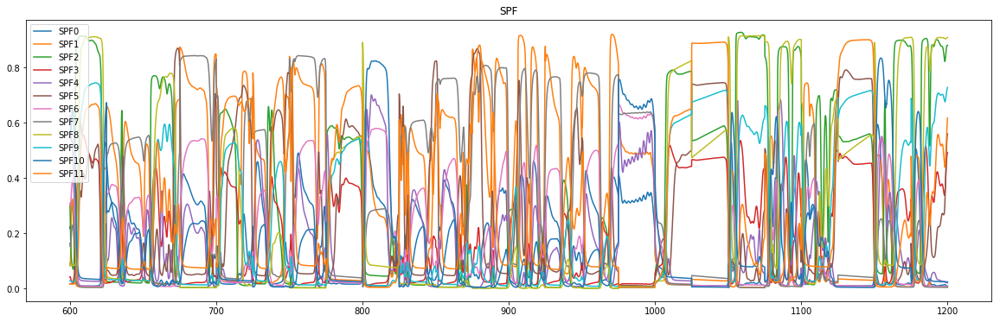

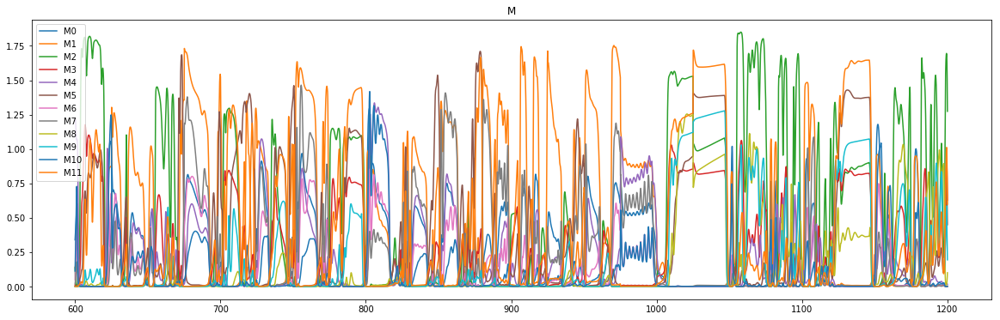

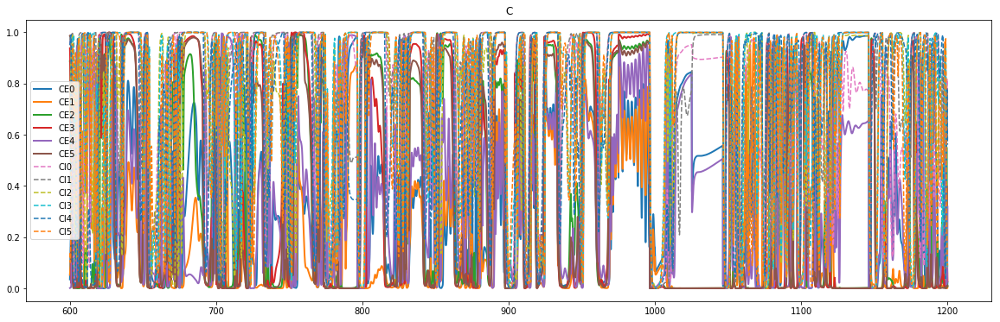

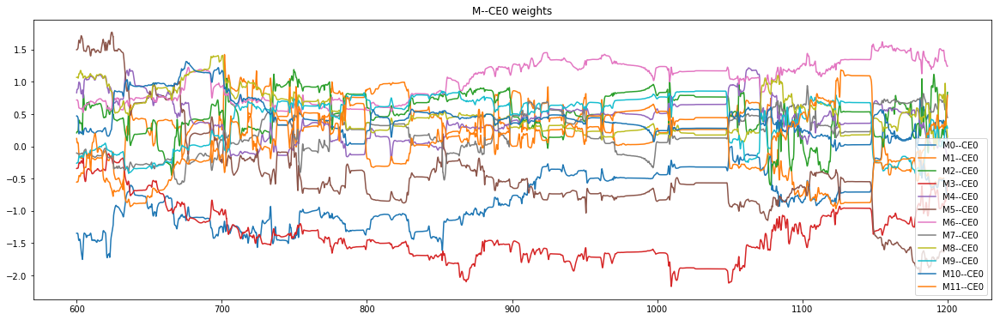

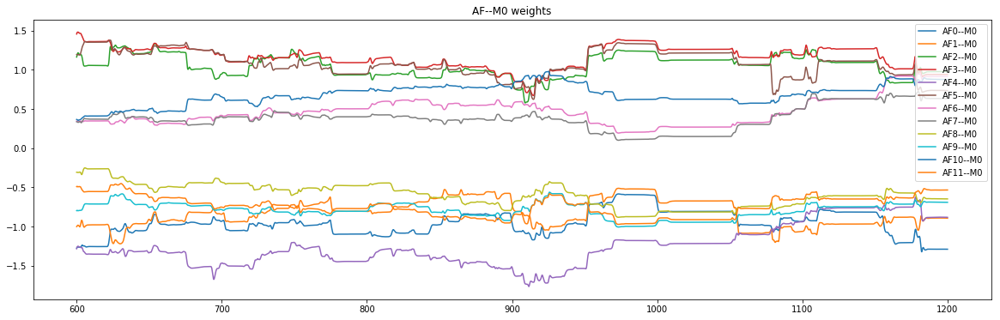

In [10]:
arm_activs = plant_data[P]
# SPF
fs = (20,6)
SPF_fig = plt.figure(figsize=fs)
SPF_data = np.array(data[SPF])
plt.plot(times, SPF_data.transpose())
SPF_legends = ['SPF'+str(i) for i in range(len(SPF))]
plt.legend(SPF_legends)
plt.title('SPF')
print(SPF_data[:,-1])

# M
M_fig = plt.figure(figsize=fs)
M_data = np.array(data[M])
plt.plot(times, M_data.transpose())
M_legends = ['M'+str(i) for i in range(len(M))]
plt.legend(M_legends)
plt.title('M')
print(M_data[:,-1])

# C
C_fig = plt.figure(figsize=fs)
CE_data = np.array(data[CE])
CI_data = np.array(data[CI])
plt.plot(times, CE_data.transpose(), linewidth=2)
plt.plot(times, CI_data.transpose(), '--')
C_legends = ['CE'+str(i) for i in range(len(CE))]
C_legends += ['CI'+str(i) for i in range(len(CI))]
plt.legend(C_legends)
plt.title('C')

# M--CE0 weights
W_fig1 = plt.figure(figsize=fs)
w_track_data = np.array(data[M_CE_track])
plt.plot(times, w_track_data.transpose())
M_CE0_legends = ['M'+str(i)+'--CE0' for i in range(len(M_CE_track))]
plt.legend(M_CE0_legends)
plt.title('M--CE0 weights')

# AF--M0 weights
W_fig2 = plt.figure(figsize=fs)
w_track_data2 = np.array(data[AF_M0_track])
plt.plot(times, w_track_data2.transpose())
AF_M0_legends = ['AF'+str(i)+'--M0' for i in range(len(AF_M0_track))]
plt.legend(AF_M0_legends)
plt.title('AF--M0 weights')

plt.show()

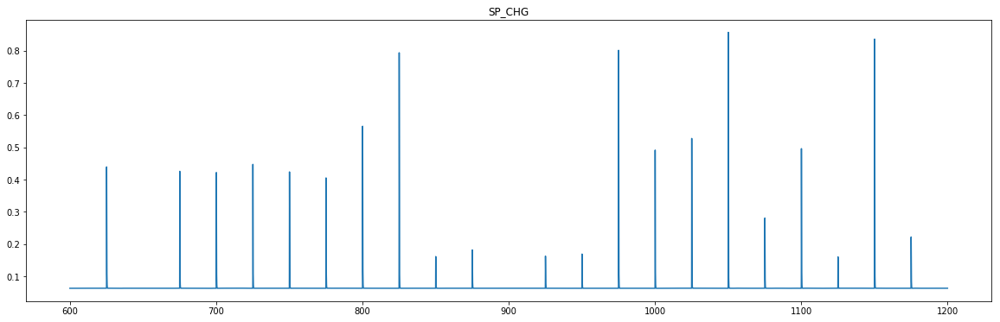

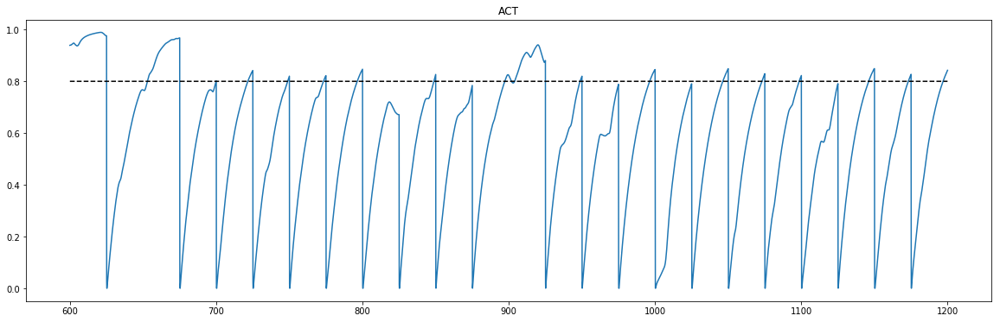

In [11]:
chg_fig = plt.figure(figsize=fs)
chg_data = np.array(data[SP_CHG])[0]
plt.plot(times, chg_data)
plt.title('SP_CHG')

act_fig = plt.figure(figsize=fs)
act_data = np.array(data[ACT])[0]
plt.plot(times, act_data)
plt.plot(times, 0.8*np.ones_like(times), 'k--')

plt.title('ACT')
plt.show()

shoulder angle: 1.348364, shoulder vel: 2.246561
AFe_data:
[2.09386679e-01 2.78673743e-01 1.38557367e-01 1.34061992e-01
 2.22823958e-01 5.93256532e-02 7.32131593e-03 4.78552580e-07
 2.98522994e-01 1.90193062e-01 2.02778692e-03 2.53709036e-01
 2.36463950e-07 2.44719362e-08 3.87281893e-01 2.46056453e-01
 1.57205560e-07 2.72715245e-01]
AFi_data:
[8.78826345e-02 5.29809117e-02 9.66785770e-02 9.67644435e-02
 9.00485052e-02 1.57885816e-01 1.88339981e-01 2.76996903e-01
 3.69707964e-07 5.60624855e-03 2.36353477e-01 2.35313802e-03
 2.36561179e-01 3.70628581e-01 3.14463456e-09 9.08629782e-08
 2.51780144e-01 1.39324707e-07]


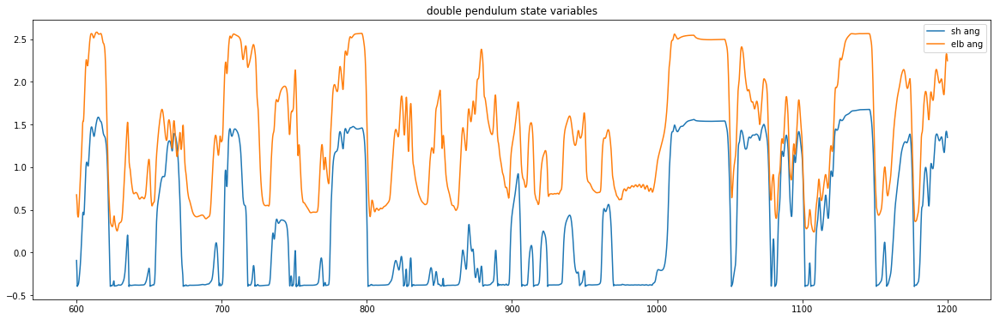

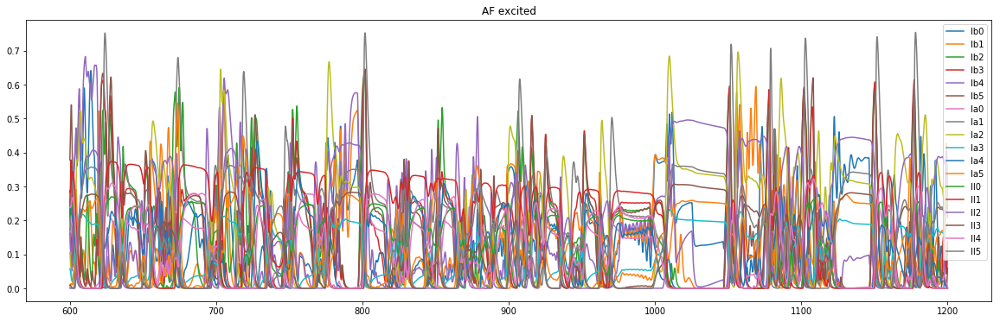

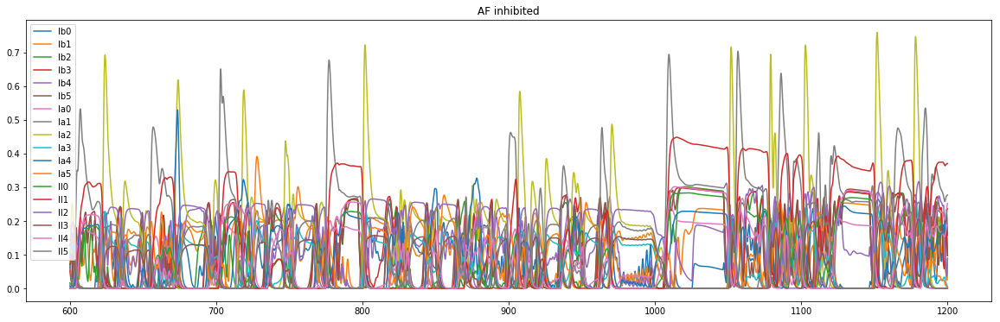

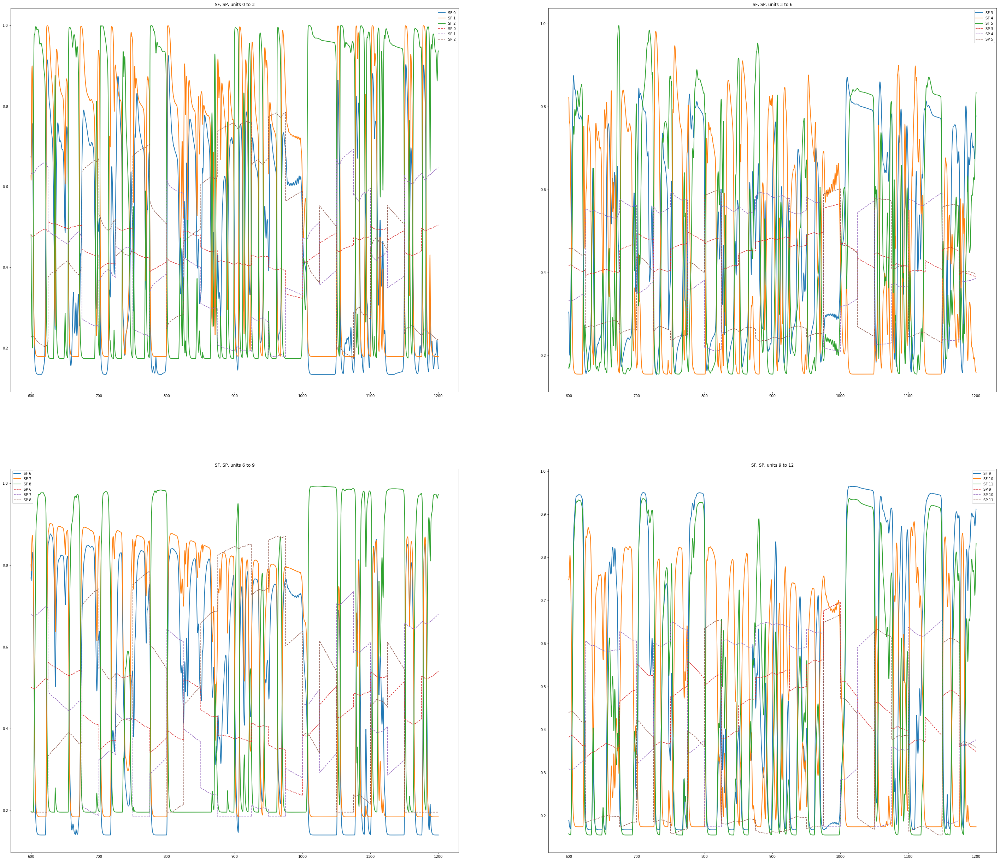

SF = 
[0.14790341 0.1784559  0.93625215 0.77756676 0.15860568 0.83369448
 0.13998115 0.18433488 0.97231011 0.91204352 0.17420725 0.8315925 ]
SP = 
[0.50487882 0.64698934 0.21920756 0.38914997 0.38713529 0.39546397
 0.54012089 0.6795385  0.19585579 0.34872655 0.37671082 0.35804654]


In [12]:
# P
P_fig = plt.figure(figsize=fs)
P_state = plant_data[P][:,0:4:2]
plt.plot(times, P_state)
#plt.legend(['sh ang', 'sh ang vel', 'elb ang', 'elb ang vel'])
plt.legend(['sh ang', 'elb ang',])
plt.title('double pendulum state variables')
print("shoulder angle: %f, shoulder vel: %f" % (P_state[-1,0],P_state[-1,1]))

# AF plus
AFe_fig = plt.figure(figsize=fs)
AFe_data = np.array(data[AF[0:18]])
plt.plot(times, AFe_data.transpose())
AF_legends = ['Ib' + str(i) for i in range(6)] + \
             ['Ia' + str(i) for i in range(6)] + \
             ['II' + str(i) for i in range(6)]
plt.legend(AF_legends)
plt.title('AF excited')
print('AFe_data:')
print(AFe_data[:,-1])

# AF minus
AFi_fig = plt.figure(figsize=fs)
AFi_data = np.array(data[AF[18:36]])
plt.plot(times, AFi_data.transpose())
AF_legends = ['Ib' + str(i) for i in range(6)] + \
             ['Ia' + str(i) for i in range(6)] + \
             ['II' + str(i) for i in range(6)]
plt.legend(AF_legends)
plt.title('AF inhibited')
print('AFi_data:')
print(AFi_data[:,-1])

# SF, SP
fs_old = fs
fs=(50,20)
SF_fig, axs = plt.subplots(2, 2, figsize=(fs[0], 2.2*fs[1]))
SF_data = np.array(data[SF])
SP_data = np.array(data[SP])
for row in range(2):
    for col in range(2):
        ax = axs[row][col]
        base = 3*col + 6*row
        ax.plot(times, SF_data[base:base+3, :].transpose(), linewidth=2)
        ax.plot(times, SP_data[base:base+3, :].transpose(), '--')
        ax.set_title('SF, SP, units %d to %d' % (base, base+3))
        SF_legends = ['SF '+ str(base+i) for i in range(3)]
        SP_legends = ['SP '+ str(base+i) for i in range(3)]
        ax.legend(SF_legends + SP_legends)

plt.show()
fs = fs_old
print('SF = ')
print(SF_data[:,-1])
print('SP = ')
print(SP_data[:,-1])

X=0


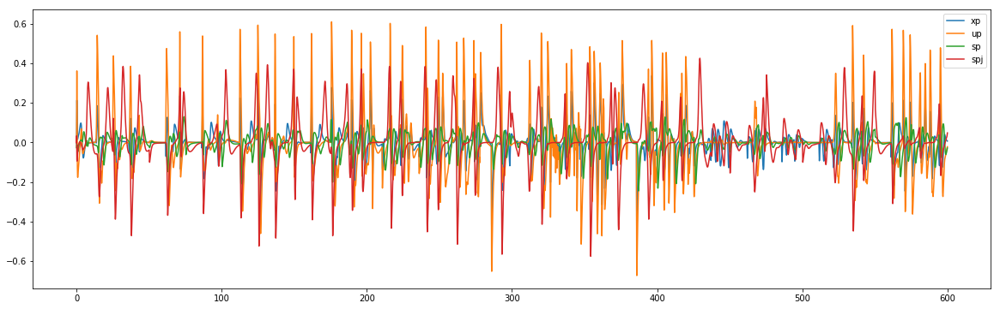

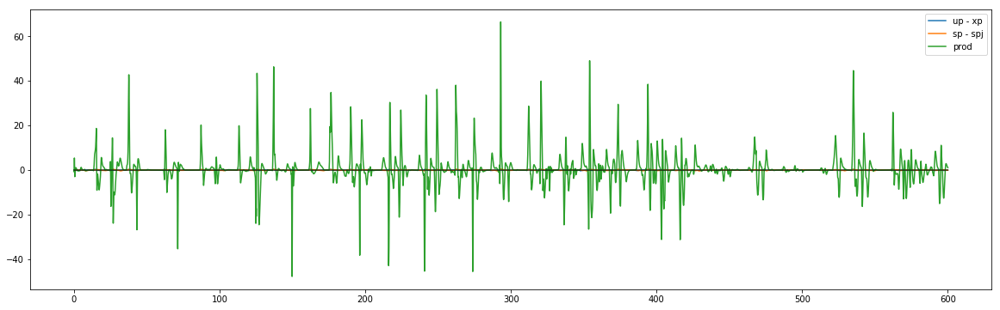

In [9]:
# plot all factors in the MX--C0 synaptic plasticity
print('X=%d' % (X))
fs = (20,6)
plastic_fig = plt.figure(figsize=fs)
xp_data = np.array(data[xp_track[0]])
up_data = np.array(data[up_track[0]])
sp_data = np.array(data[sp_track[0]])
spj_data = np.array(data[spj_track[0]])
plt.plot(times, xp_data)
plt.plot(times, up_data)
plt.plot(times, sp_data)
plt.plot(times, spj_data)
plt.legend(['xp', 'up', 'sp', 'spj'])

plastic_fig2 = plt.figure(figsize=fs)
f1 = up_data - xp_data
f2 = sp_data - spj_data
rule = 500. * f1 * f2
plt.plot(times, f1)
plt.plot(times, f2)
plt.plot(times, rule)
plt.plot(times, np.zeros(len(times)), 'k', linewidth=1)
plt.legend(['up - xp', 'sp - spj', 'prod'])
plt.show()

AL_data:
[0.12076204 0.14952098 0.07771728 0.09096184 0.15329982 0.08015915]


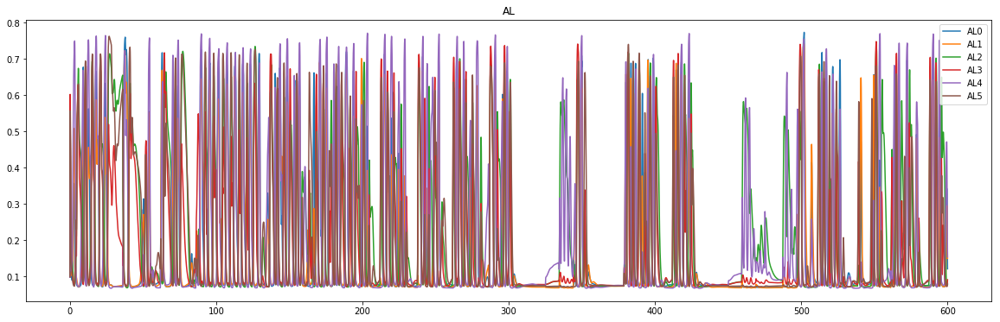

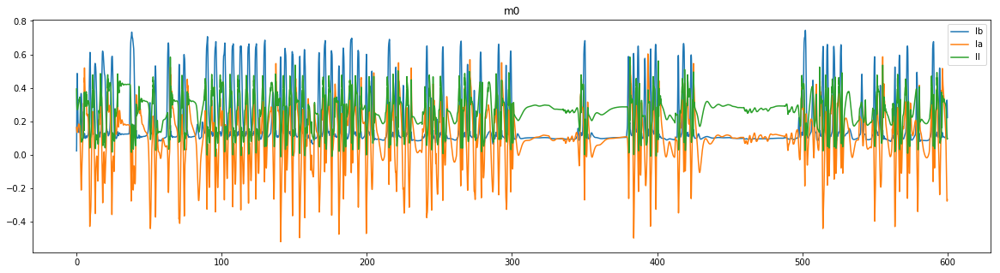

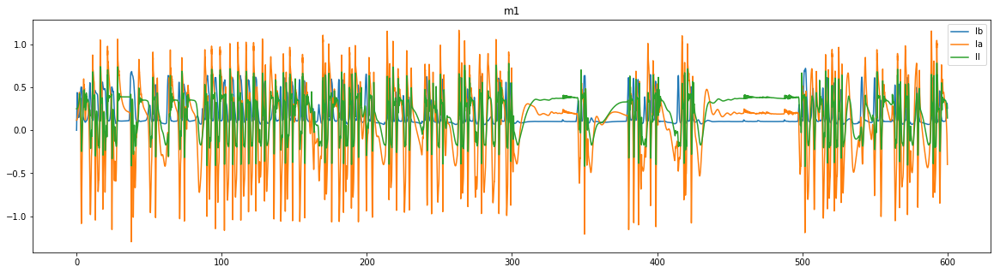

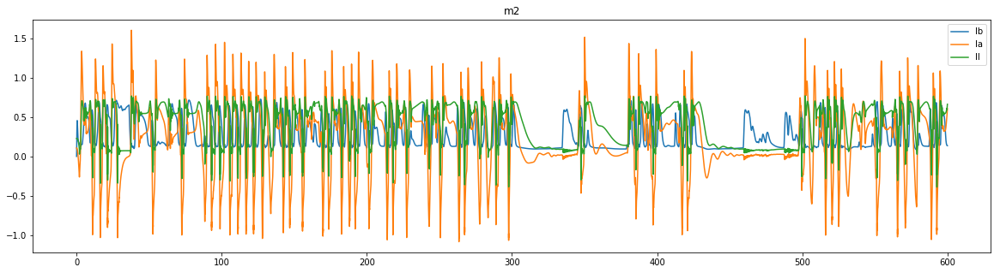

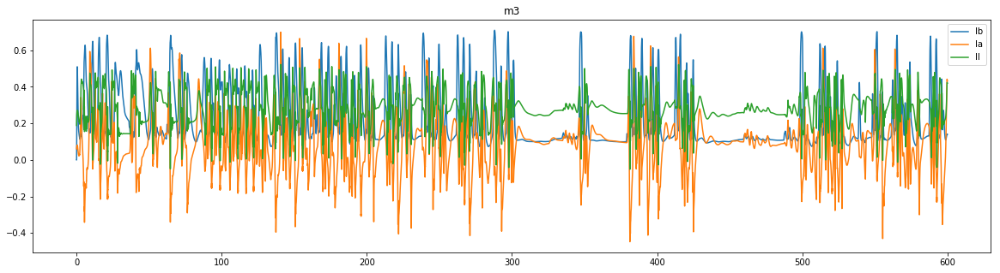

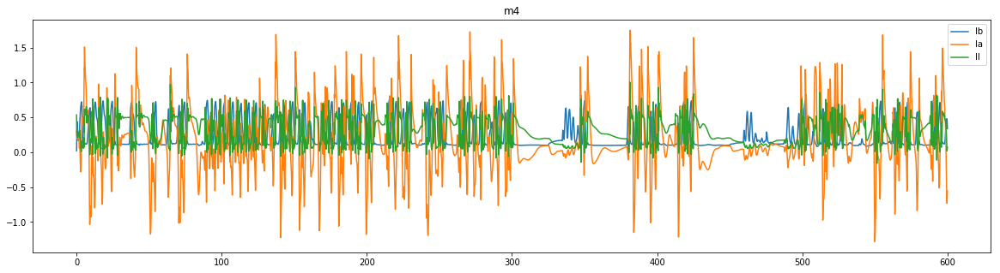

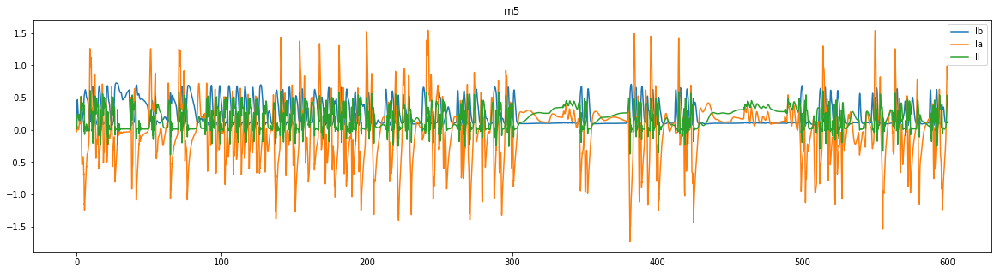

In [10]:
# Alpha units
AL_fig = plt.figure(figsize=fs)
AL_data = np.array(data[AL])
plt.plot(times, AL_data.transpose())
AL_legends = ['AL'+str(i) for i in range(len(AL))]
plt.legend(AL_legends)
plt.title('AL')
print('AL_data:')
print(AL_data[:,-1])

# plotting muscle outputs
fs = (20,5)
legs = ['Ib', 'Ia', 'II']

for i in range(6):
    next_fig = plt.figure(figsize=fs)
    Ib = arm_activs[:,22+i]
    Ia = arm_activs[:,28+i]
    II = arm_activs[:,34+i]
    plt.plot(times, Ib, times, Ia, times, II)
    #plt.plot(times, Ib)
    plt.legend(legs)
    plt.title('m' + str(i))
plt.show()

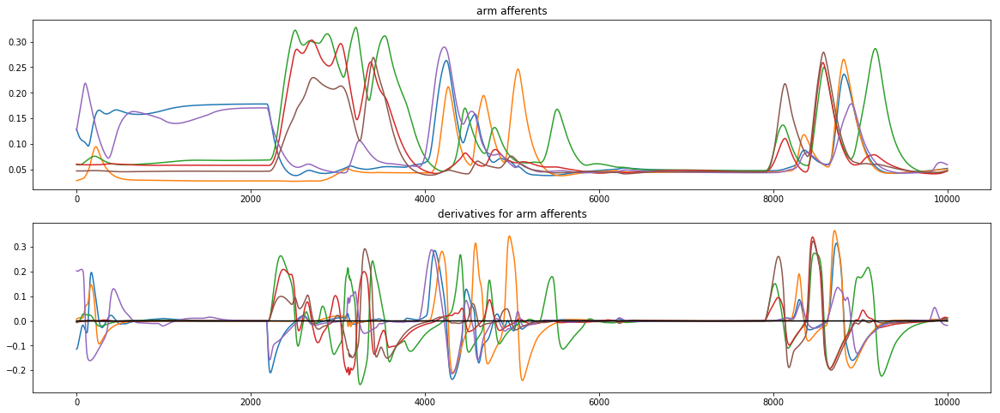

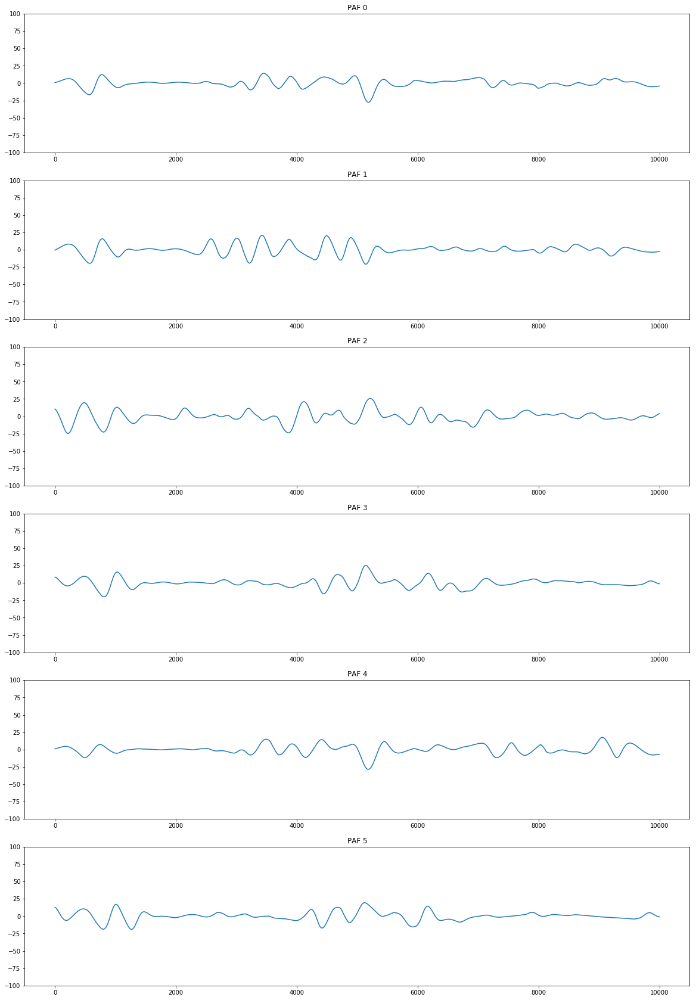

In [44]:
# ANALYSIS OF CORRELATIONS BETWEEN ARM AFFERENTS

# obtaining arm afferents and their derivatives
n_points = 10000
PAF = arm_activs[:n_points, 22:28] # tension afferents directly from arm
PAF_diff = np.gradient(PAF, axis=0) / net.min_delay
fig, axs = plt.subplots(2, 1, figsize=(20, 8))
axs[0].plot(PAF)
axs[0].set_title('arm afferents')
axs[1].plot(PAF_diff)
axs[1].set_title('derivatives for arm afferents')
axs[1].plot(np.zeros(PAF_diff.shape[0]), 'k')

# comparing some signals
#fig, axs = plt.subplots(2, 1, figsize=(20, 8))
#axs[0].plot(PAF[:,6], 'b', PAF[:,14], 'r')
#axs[1].plot(PAF[:,6], 'b', PAF[:,10], 'r')

# plotting the correlation of one signal against all others
Ia_0 = arm_activs[:n_points, 28]
Ia_0_diff = np.gradient(Ia_0) / net.min_delay
corr_fig, corr_axs = plt.subplots(6, 1, figsize=(20,30))
for row in range(6):
    corr = np.correlate(Ia_0_diff, PAF_diff[:, row], mode='same')
    corr_axs[row].plot(corr)
    corr_axs[row].set_ylim([-100,100])
    corr_axs[row].set_title('PAF ' + str(row))
plt.show()

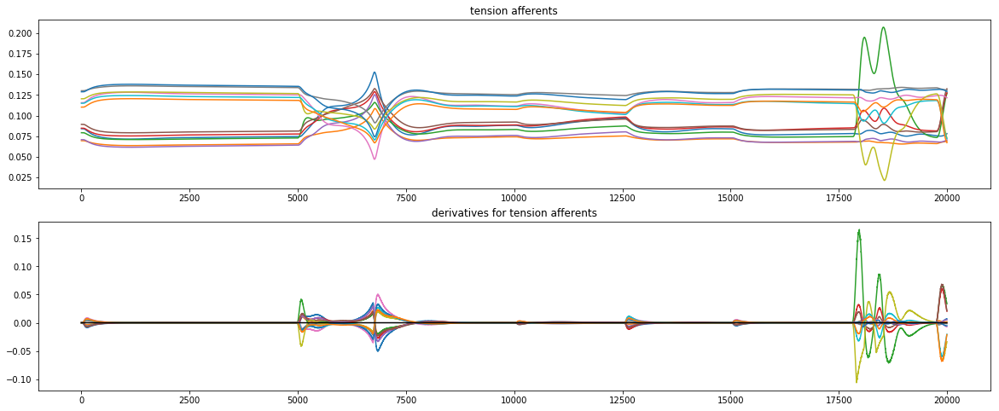

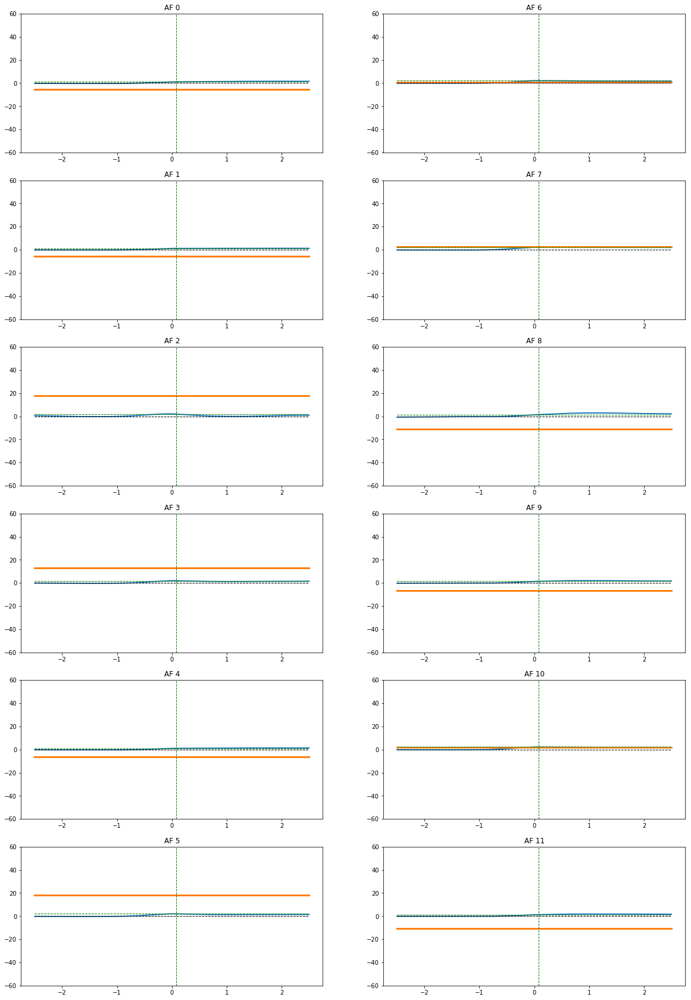

In [45]:
# ANALYSIS OF CORRELATIONS BETWEEN AFFERENT UNITS 
##############################
### NON-NORMALIZED VERSION ###
##############################
# obtaining arm afferents and their derivatives
n_points = 20000
AFD = data[AF[0:6]+AF[18:24], :n_points].transpose() # tension afferents
AFD_diff = np.gradient(AFD, axis=0) / net.min_delay
fig, axs = plt.subplots(2, 1, figsize=(20, 8))
axs[0].plot(AFD)
axs[0].set_title('tension afferents')
axs[1].plot(AFD_diff)
axs[1].set_title('derivatives for tension afferents')
axs[1].plot(np.zeros(AFD_diff.shape[0]), 'k')

# comparing some signals
#fig, axs = plt.subplots(2, 1, figsize=(20, 8))
#axs[0].plot(AFD[:,6], 'b', AFD[:,14], 'r')
#axs[1].plot(AFD_diff[:,6], 'b', AFD[:,10], 'r')

# plotting the correlation of one signal against all others
Ia_0 = arm_activs[:n_points, 28]  # The signal we'll compare
Ia_0_diff = np.gradient(Ia_0) / net.min_delay
AF__M0_w = [syn.w for syn in net.syns[M[0]] if syn.preID in AF[0:6]+AF[18:24]]
corr_fig, corr_axs = plt.subplots(6, 2, figsize=(20,30))
mid = int(round(AFD.shape[0]/2.)) # middle index for the signal (where 0 is)
span = min(500, mid)   # span to plot for the correlation
t = np.linspace(-span*net.min_delay, span*net.min_delay, 2*span)
x = t[int(len(t)/2)+AF__M_syn['extra_steps']] # the point approached by the plasticity rule
max_c = 60
min_c = -60
des_val_idx = mid + AF__M_syn['extra_steps']
lw = 2 # linewidth
for col in range(2):
    for row in range(6):
        cur_idx = 6*col + row
        corr = np.correlate(Ia_0_diff, AFD[:,cur_idx], mode='same')
        corr_axs[row,col].plot(t, corr[mid-span:mid+span], linewidth=lw)
        corr_axs[row,col].set_ylim([min_c,max_c])
        corr_axs[row,col].plot(t, 10.*AF__M0_w[cur_idx]*np.ones(len(t)), linewidth=3)
        corr_axs[row,col].plot(t, corr[des_val_idx]*np.ones(len(t)), 'g--', linewidth=1)
        corr_axs[row,col].plot([x, x], [min_c, max_c], 'g--', linewidth=1)
        corr_axs[row,col].plot(t, np.zeros(len(t)), 'k--', linewidth=1)
        corr_axs[row,col].set_title('AF ' + str(cur_idx))
plt.show()

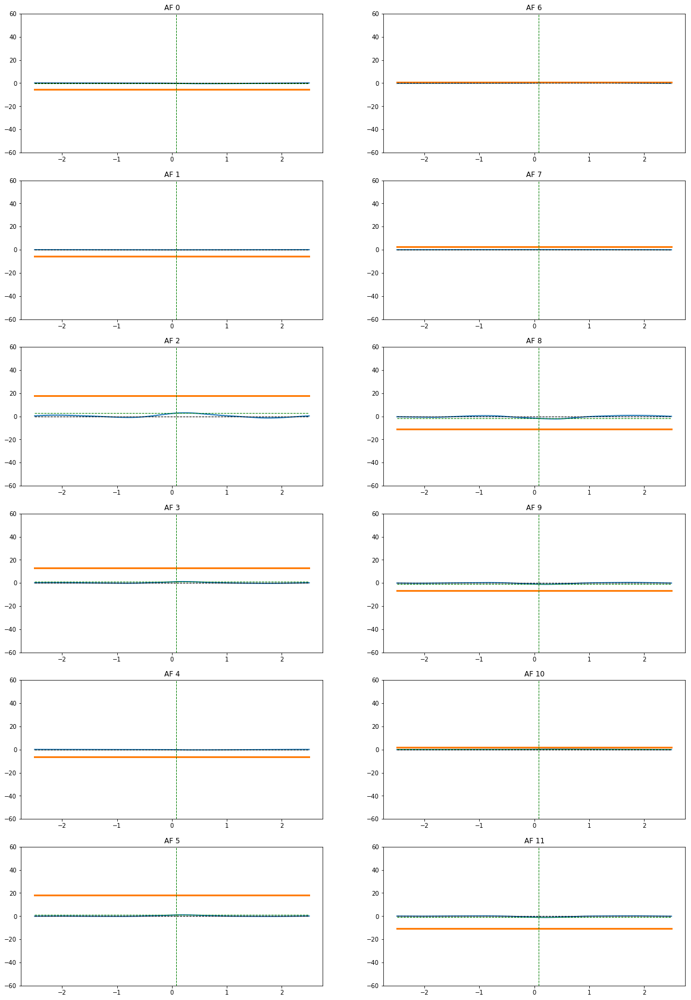

In [46]:
# plotting AF_diff VS AF_diff instead of AF_diff VS AF, to see if 
# the correlations are more informative
corr_fig2, corr_axs2 = plt.subplots(6, 2, figsize=(20,30))
for col in range(2):
    for row in range(6):
        cur_idx = 6*col + row
        corr = np.correlate(Ia_0_diff, AFD_diff[:,cur_idx], mode='same')
        corr_axs2[row,col].plot(t, corr[mid-span:mid+span], linewidth=lw)
        corr_axs2[row,col].set_ylim([min_c,max_c])
        corr_axs2[row,col].plot(t, 10.*AF__M0_w[cur_idx]*np.ones(len(t)), linewidth=3)
        corr_axs2[row,col].plot(t, corr[des_val_idx]*np.ones(len(t)), 'g--', linewidth=1)
        corr_axs2[row,col].plot([x, x], [min_c, max_c], 'g--', linewidth=1)
        corr_axs2[row,col].plot(t, np.zeros(len(t)), 'k--', linewidth=1)
        corr_axs2[row,col].set_title('AF ' + str(cur_idx))
plt.show()

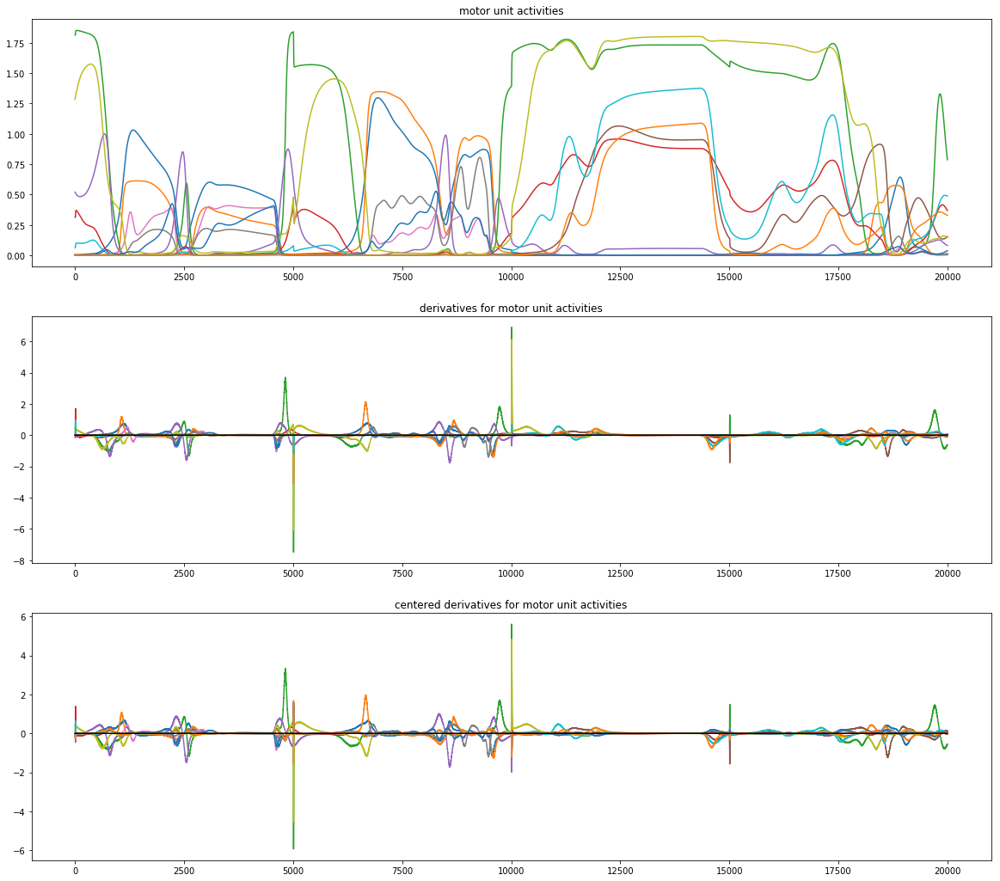

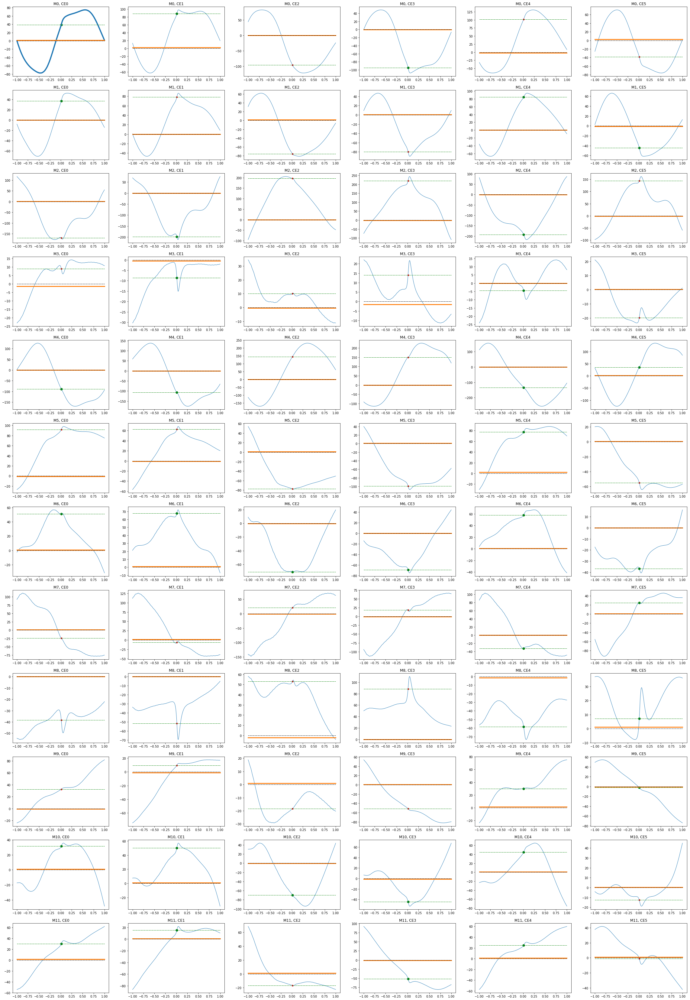

[[1. 1. 0. 1. 0. 0.]
 [1. 0. 0. 0. 1. 1.]
 [0. 1. 0. 0. 1. 0.]
 [0. 1. 0. 0. 1. 0.]
 [1. 1. 0. 0. 1. 1.]
 [0. 0. 0. 0. 1. 0.]
 [1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 1. 1.]
 [1. 1. 1. 1. 1. 0.]
 [1. 1. 0. 1. 1. 0.]]
[ 6.  7.  2.  4. 11.  6.]
[3. 3. 2. 2. 4. 1. 6. 2. 2. 2. 5. 4.]
0.5
normalized M__CE correlation weight matrix:
[[ 0.16499896, 0.31485054, -0.31215892, -0.27785151, 0.33989681, -0.21878764]
, [ 0.15767599, 0.27941319, -0.24713774, -0.23325747, 0.28141646, -0.25287286]
, [-0.71875043, -0.7045596, 0.63878147, 0.6450166, -0.64226938, 0.81627703]
, [ 0.03794569, -0.03058155, 0.03235077, 0.0410515, -0.01454212, -0.11346646]
, [-0.37642227, -0.38373382, 0.47238299, 0.43890868, -0.4463985, 0.20154873]
, [ 0.38910521, 0.22272303, -0.25225502, -0.29070506, 0.25812613, -0.31292291]
, [ 0.21581537, 0.24091435, -0.22999731, -0.20254744, 0.19384452, -0.20964337]
, [-0.10442191, -0.02239995, 0.06735549, 0.05288315, -0.10784916, 0.13940851]
, [-0.16318

In [9]:
# ANALYSIS OF CORRELATIONS BETWEEN MOTOR UNITS, CE

# obtaining M,C unit activities and their derivatives
full_size = len(data[M[0]])
M_size = 20000 # number of points we will take from the M data signals
C_span = 8000 # number of points in half of the C data moving window
center_idx = int(round(full_size/2))
MD = data[M, -M_size:].transpose()
MD_diff = np.gradient(MD, axis=0) / net.min_delay
MD_diff_means = np.tile(np.mean(MD_diff, axis=1), (12,1)).transpose()
MD_diff_center = MD_diff - MD_diff_means
CED = data[CE, center_idx-C_span:center_idx+C_span].transpose()
CED_diff = np.gradient(CED, axis=0) / net.min_delay
CED_diff_means = np.tile(np.mean(CED_diff, axis=1), (6,1)).transpose()
CED_diff_center = CED_diff - CED_diff_means
fig, axs = plt.subplots(3, 1, figsize=(20, 18))
axs[0].plot(MD)
axs[0].set_title('motor unit activities')
axs[1].plot(MD_diff)
axs[1].set_title('derivatives for motor unit activities')
axs[1].plot(np.zeros(MD_diff.shape[0]), 'k')
axs[2].plot(MD_diff_center)
axs[2].set_title('centered derivatives for motor unit activities')
axs[2].plot(np.zeros(MD_diff_center.shape[0]), 'k')

# plotting the correlation of one signal against all others
M__CE_w = [[syn.w for syn in net.syns[c] if syn.preID in M] for c in CE]
corr_fig, corr_axs = plt.subplots(12, 6, figsize=(40,60))
base_idx = 0 # index for positive Ia afferent for muscle 0
mid = int(round((M_size - 2*C_span)/2)) # index of the middle 0 shift value
plt_span = min(200, mid)   # span to plot for the correlation
t = np.linspace(-plt_span*net.min_delay, plt_span*net.min_delay, 2*plt_span)
max_c = 90
min_c = -90
eqs = np.zeros((12,6)) # matrix indicating whether weight and correlation have same sign
corr_w = np.zeros((12,6)) # what the weight should be, according to the correlation
#des_val_idx = mid + 12
des_val_idx = mid + CE_params['custom_inp_del']
for col in range(6):
    for row in range(12):
        cur_idx = 12*col+row
        if cur_idx == base_idx: lw = 4
        else: lw = 1
        corr = np.correlate(CED_diff_center[:,col], -MD_diff_center[:,row], mode='valid')
        corr_axs[row,col].plot(t, corr[mid-plt_span:mid+plt_span], linewidth=lw)
        #corr_axs[row,col].set_ylim([min_c,max_c])
        corr_w[row,col] = corr[des_val_idx]
        corr_axs[row,col].plot(t, 3.*M__CE_w[col][row]*np.ones(len(t)), linewidth=3)
        corr_axs[row,col].plot(t, corr[des_val_idx]*np.ones(len(t)), 'g--', linewidth=1)
        x = t[int(len(t)/2) +CE_params['custom_inp_del']]
        #x = t[int(len(t)/2) + 12]
        #corr_axs[row,col].plot([x, x], [min_c, max_c], 'g--', linewidth=1)
        corr_axs[row,col].plot(t, np.zeros(len(t)), 'k--', linewidth=1)
        corr_axs[row,col].set_title('M' + str(row) + ', CE' + str(col))
        # Finding if weights are following the correlations
        scat_s = 20
        scat_c = 'r'
        if np.sign(M__CE_w[col][row]) == np.sign(corr[des_val_idx]):
            eqs[row,col] = 1.
            scat_s = 50
            scat_c = 'g'
        corr_axs[row,col].scatter([x], [corr[des_val_idx]], s=scat_s, c=scat_c)
plt.show()

# Regarding whether correlations and weights have the same sign
print(eqs)
print(np.sum(eqs, axis=0))
print(np.sum(eqs, axis=1))
print(sum(eqs.flatten())/(12*6))
# Regarding desired weights according to correlations
# normalizing columns of corr_w (weights on the same C unit)
n_corr_w = corr_w / np.linalg.norm(corr_w, axis=0)
print('normalized M__CE correlation weight matrix:')
import re
print(re.sub('\[,', '[', re.sub('\ +', ', ', str(n_corr_w))))

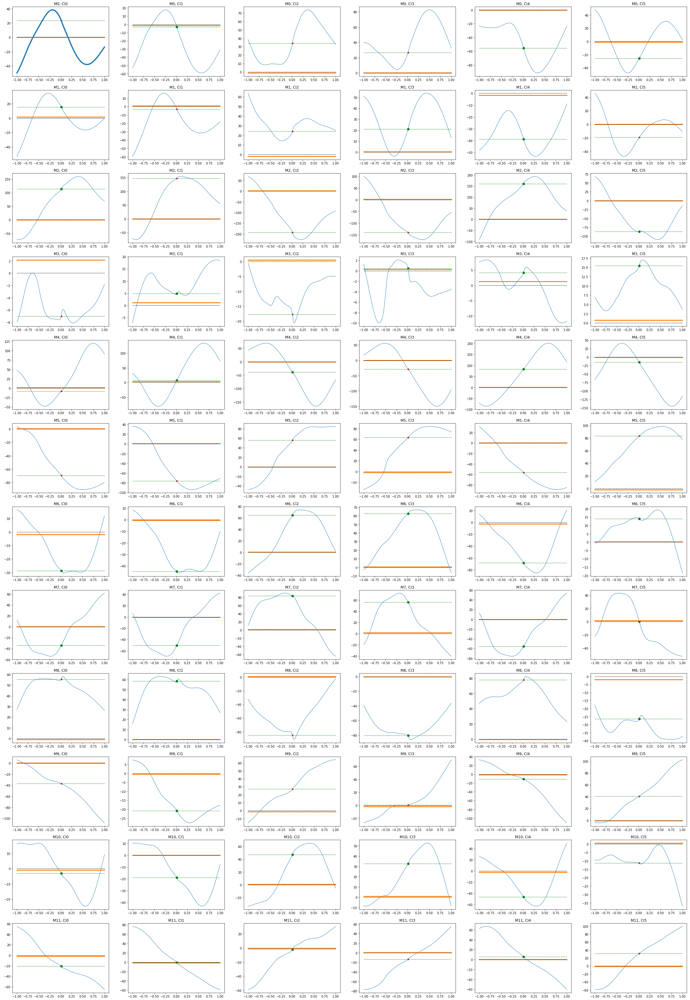

[[0. 1. 0. 0. 1. 1.]
 [1. 0. 0. 1. 1. 0.]
 [1. 0. 0. 0. 1. 1.]
 [0. 1. 0. 1. 1. 1.]
 [0. 1. 1. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0.]
 [1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1.]
 [0. 1. 0. 1. 0. 1.]
 [0. 1. 0. 0. 1. 0.]
 [1. 1. 1. 1. 1. 0.]
 [1. 1. 1. 0. 1. 0.]]
[ 6.  9.  5.  6. 10.  7.]
[3. 3. 3. 4. 4. 0. 6. 6. 3. 2. 5. 4.]
0.5972222222222222
normalized M__CI correlation weight matrix:
[[ 0.14676978, -0.01594287, 0.13362462, 0.13254286, -0.23412678, -0.18191077]
, [ 0.09722965, -0.01565568, 0.09491409, 0.10483095, -0.16223412, -0.13755542]
, [ 0.71158448, 0.7716339, -0.75600311, -0.69670737, 0.67375591, -0.62028235]
, [-0.04380814, 0.02514003, -0.06953584, 0.00210383, 0.01743827, 0.10964416]
, [-0.05088431, 0.04175844, -0.15091132, -0.14370223, 0.35063004, -0.1116104, ]
, [-0.43428716, -0.40045543, 0.21692471, 0.31417674, -0.23731993, 0.59257184]
, [-0.17956899, -0.23559197, 0.2549992, 0.31129612, -0.28769437, 0.10008599]
, [-0.21425228, -0.26477636, 0.3261338, 0.28050144, -0.23274115, 0.000806

In [10]:
# ANALYSIS OF CORRELATIONS BETWEEN MOTOR UNITS, CI

CID = data[CI, center_idx-C_span:center_idx+C_span].transpose()
CID_diff = np.gradient(CID, axis=0) / net.min_delay
CID_diff_means = np.tile(np.mean(CID_diff, axis=1), (6,1)).transpose()
CID_diff_center = CID_diff - CID_diff_means

# plotting the correlation of one signal against all others
M__CI_w = [[syn.w for syn in net.syns[c] if syn.preID in M] for c in CI]
corr_fig, corr_axs = plt.subplots(12, 6, figsize=(40,60))
base_idx = 0 # index for positive Ia afferent for muscle 0
span = min(200, mid)   # span to plot for the correlation
t = np.linspace(-span*net.min_delay, span*net.min_delay, 2*span)
max_c = 50.
min_c = -50.
eqs = np.zeros((12,6))
corr_w = np.zeros((12,6)) # what the weight should be, according to the correlation
des_val_idx = mid + CI_params['custom_inp_del']
#des_val_idx = mid + 12
for col in range(6):
    for row in range(12):
        cur_idx = 12*col+row
        if cur_idx == base_idx: lw = 4
        else: lw = 1
        corr = np.correlate(CID_diff_center[:,col], -MD_diff_center[:,row], mode='valid')
        corr_axs[row,col].plot(t, corr[mid-span:mid+span], linewidth=lw)
        #corr_axs[row,col].set_ylim([min_c,max_c])
        corr_w[row,col] = corr[des_val_idx]
        corr_axs[row,col].plot(t, 2.*M__CI_w[col][row]*np.ones(len(t)), linewidth=3)
        corr_axs[row,col].plot(t, corr[des_val_idx]*np.ones(len(t)), 'g--', linewidth=1)
        x = t[int(len(t)/2) + CI_params['custom_inp_del']]
        #x = t[int(len(t)/2)+ 12]
        #corr_axs[row,col].plot([x, x], [min_c, max_c], 'g--', linewidth=1)
        corr_axs[row,col].plot(t, np.zeros(len(t)), 'k--', linewidth=1)
        corr_axs[row,col].set_title('M' + str(row) + ', CI' + str(col))
        # Finding if weights are following the correlations
        scat_s = 20
        scat_c = 'r'
        if np.sign(M__CI_w[col][row]) == np.sign(corr[des_val_idx]):
            eqs[row,col] = 1.
            scat_s = 50
            scat_c = 'g'
        corr_axs[row,col].scatter([x], [corr[des_val_idx]], s=scat_s, c=scat_c)
plt.show()

# Regarding whether correlations and weights have the same sign
print(eqs)
print(np.sum(eqs, axis=0))
print(np.sum(eqs, axis=1))
print(sum(eqs.flatten())/(12*6))
# Regarding desired weights according to correlations
# normalizing columns of corr_w (weights on the same C unit)
n_corr_w = corr_w / np.linalg.norm(corr_w, axis=0)
print('normalized M__CI correlation weight matrix:')
print(re.sub('\[,', '[', re.sub('\ +', ', ', str(n_corr_w))))

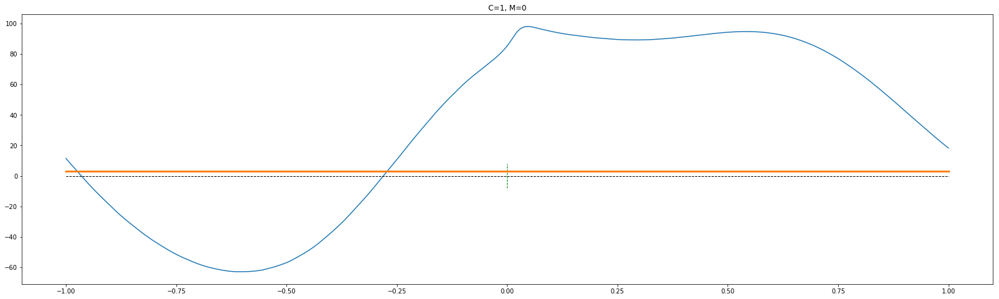

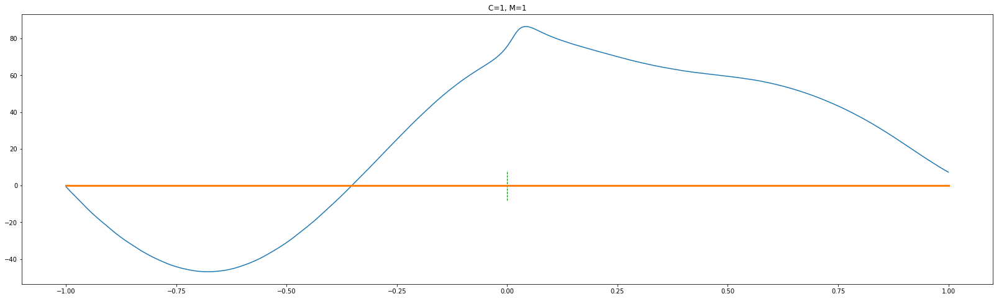

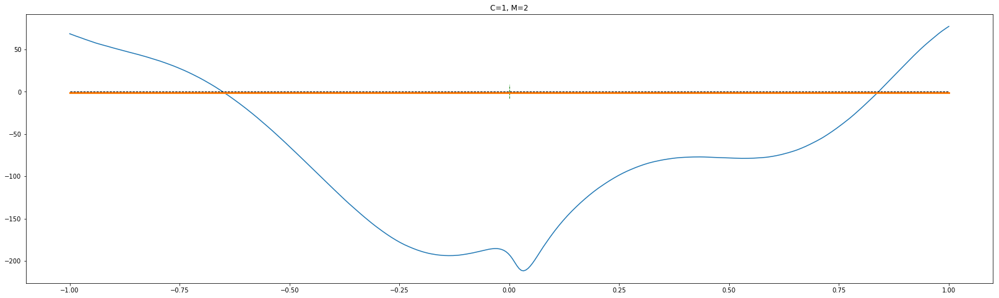

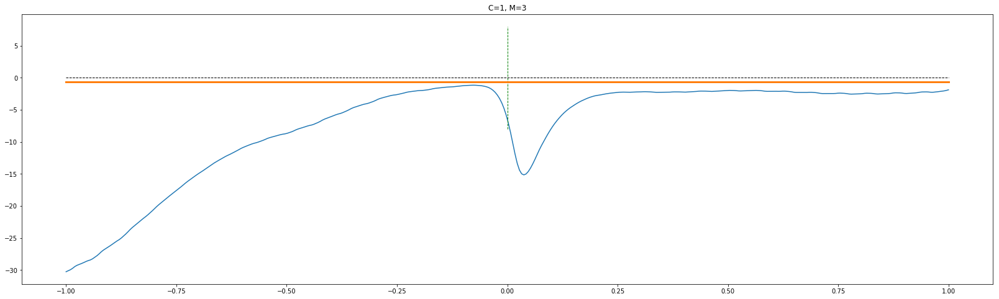

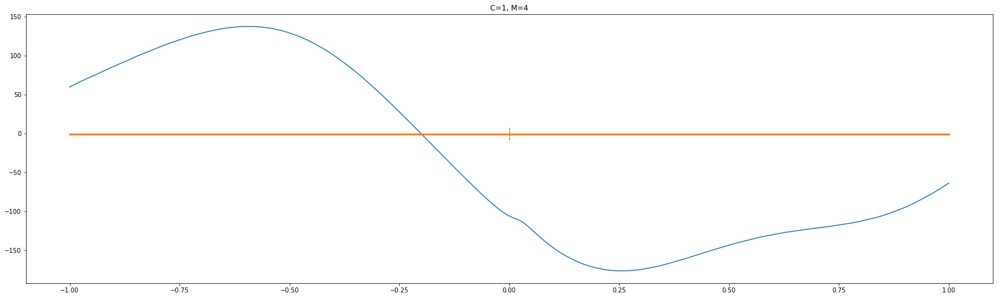

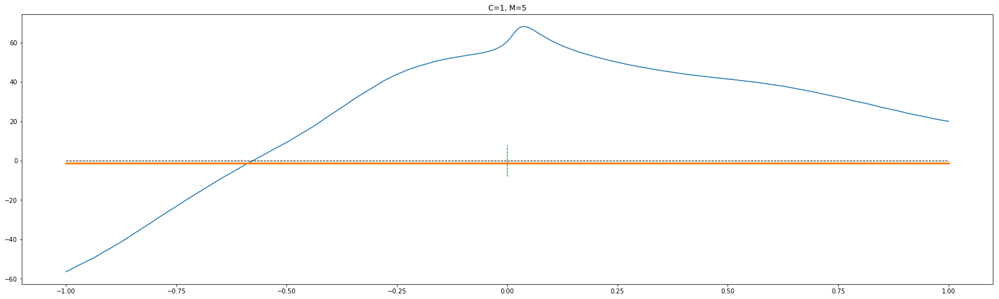

In [11]:
# CLOSEUP OF SOME CORRELATIONS: 1000 s, 0.5 s
span = 200
t = np.linspace(-span*net.min_delay, span*net.min_delay, 2*span)
c = 1
for m in range(6):
    corr = np.correlate(-CED_diff_center[:,c], MD_diff_center[:,m], mode='same')
    fig = plt.figure(figsize=(28,8))
    x = int(len(corr)/2)
    plt.plot(t, corr[x-span:x+span])
    plt.plot([0, 0], [-8., 8], 'g--', linewidth=1)
    plt.plot(t, np.zeros(2*span), 'k--', linewidth=1)
    plt.plot(t, 4.*M__CE_w[c][m]*np.ones(2*span), linewidth=3)
    plt.title('C=%d, M=%d' % (c,m))

In [12]:
# checking some connections
print("Connections to motor units")
for idx, syn in enumerate(net.syns[M[0]]):
    pre_id = syn.preID
    pre_type = net.units[pre_id].type
    if pre_type is plant_models.planar_arm_v3:
        pre_pop = 'P'
    elif pre_id in AF:
        pre_pop = 'AF'
    elif pre_id in SPF:
        pre_pop = 'SPF'
    else:
        pre_pop = 'erroneous'
    if pre_pop == 'P':
        plant_out = str(syn.plant_out)
    else:
        plant_out = 'None'
    print('%d) %s (%d) --> M, w=%f, port=%d, plant_out=%s'%(idx, pre_pop, pre_id, syn.w, syn.port, plant_out))
print("-------------------------\n")
    
print("Connections to afferent units")
for idx, syn in enumerate(net.syns[AF[0]]):
    pre_id = syn.preID
    pre_type = net.units[pre_id].type
    if pre_type is plant_models.planar_arm_v3:
        pre_pop = 'P'
    elif pre_id in AF:
        pre_pop = 'A'
    elif pre_id in SPF:
        pre_pop = 'SPF'
    else:
        pre_pop = 'other'
    if pre_pop == 'P':
        plant_out = str(syn.plant_out)
    else:
        plant_out = 'None'
    print('%d) %s (%d) --> A, w=%f, port=%d, plant_out=%s'%(idx, pre_pop, pre_id, syn.w, syn.port, plant_out))
print("-------------------------\n")
    
print("Connections to spinal units")
for idx, syn in enumerate(net.syns[CE[2]]):
    pre_id = syn.preID
    pre_type = net.units[pre_id].type
    if pre_type is plant_models.planar_arm_v3:
        pre_pop = 'P'
    elif pre_id in AF:
        pre_pop = 'AF'
    elif pre_id in SPF:
        pre_pop = 'SPF'
    elif pre_id in M:
        pre_pop = 'M'
    elif pre_id in CE:
        pre_pop = 'CE'
    elif pre_id in CI:
        pre_pop = 'CI'
    else:
        pre_pop = 'other'
    if pre_pop == 'P':
        plant_out = str(syn.plant_out)
    else:
        plant_out = 'None'
    print('%d) %s (%d) --> CE, w=%f, port=%d, plant_out=%s'%(idx, pre_pop, pre_id, syn.w, syn.port, plant_out))
print("-------------------------\n")

for idx, syn in enumerate(net.syns[CI[0]]):
    pre_id = syn.preID
    pre_type = net.units[pre_id].type
    if pre_type is plant_models.planar_arm_v3:
        pre_pop = 'P'
    elif pre_id in AF:
        pre_pop = 'AF'
    elif pre_id in SPF:
        pre_pop = 'SPF'
    elif pre_id in M:
        pre_pop = 'M'
    elif pre_id in CE:
        pre_pop = 'CE'
    elif pre_id in CI:
        pre_pop = 'CI'
    else:
        pre_pop = 'other'
    if pre_pop == 'P':
        plant_out = str(syn.plant_out)
    else:
        plant_out = 'None'
    print('%d) %s (%d) --> CI, w=%f, port=%d, plant_out=%s'%(idx, pre_pop, pre_id, syn.w, syn.port, plant_out))
print("-------------------------\n")


print("Connections to plant")
for idx, syn in enumerate(net.plants[P].inp_syns[0]):
    pre_id = syn.preID
    pre_type = net.units[pre_id].type
    if pre_id in AL:
        pre_pop = 'AL'
    else:
        pre_pop = 'erroneous'
    print('%d) %s (%d, %s) --> P, w=%f'%(idx, pre_pop, pre_id, pre_type, syn.w))
print("-------------------------\n")

print("Connections to SF units")
for idx, syn in enumerate(net.syns[SF[0]]):
    pre_id = syn.preID
    pre_type = net.units[pre_id].type
    if pre_id == P:
        pre_pop = 'P'
    elif pre_id in AF:
        pre_pop = 'AF'
    elif pre_id in SPF:
        pre_pop = 'SPF'
    elif pre_id in M:
        pre_pop = 'M'
    else:
        pre_pop = 'erroneous'
    if pre_pop == 'P':
        plant_out = str(syn.plant_out)
    else:
        plant_out = 'None'
    print('%d) %s (%d) --> SF, w=%f, port=%d, plant_out=%s'%(idx, pre_pop, pre_id, syn.w, syn.port, plant_out))

Connections to motor units
0) AF (1) --> M, w=-1.067893, port=0, plant_out=None
1) AF (2) --> M, w=-1.025377, port=0, plant_out=None
2) AF (3) --> M, w=1.192680, port=0, plant_out=None
3) AF (4) --> M, w=1.398663, port=0, plant_out=None
4) AF (5) --> M, w=-1.178054, port=0, plant_out=None
5) AF (6) --> M, w=1.476442, port=0, plant_out=None
6) AF (19) --> M, w=0.420648, port=0, plant_out=None
7) AF (20) --> M, w=0.609561, port=0, plant_out=None
8) AF (21) --> M, w=-0.332810, port=0, plant_out=None
9) AF (22) --> M, w=-0.299321, port=0, plant_out=None
10) AF (23) --> M, w=0.560248, port=0, plant_out=None
11) AF (24) --> M, w=-0.437987, port=0, plant_out=None
12) SPF (92) --> M, w=2.000000, port=1, plant_out=None
13) erroneous (91) --> M, w=1.000000, port=2, plant_out=None
-------------------------

Connections to afferent units
0) other (0) --> A, w=1.000000, port=0, plant_out=None
-------------------------

Connections to spinal units
0) M (55) --> CE, w=0.076536, port=0, plant_out=None

---

In [28]:
#Animation of the arm and muscles
%matplotlib widget
from numpy import cos, sin
from matplotlib.animation import FuncAnimation

# angles of shoulder and elbow
theta_s = arm_activs[:,0]
theta_e = arm_activs[:,2]
phi = theta_s + theta_e # elbow angle wrt x axis
# data from tracking units
acts = np.array(data[1])
ipx = data[ipx_track]
ipy = data[ipy_track]
ten = arm_activs[:, np.array(range(4,10))].transpose()
# coordinates of hand and elbow
l1 = net.plants[P].l_arm
l2 = net.plants[P].l_farm
xe = cos(theta_s)*l1
ye = sin(theta_s)*l1
xh = xe + cos(phi)*l2
yh = ye + sin(phi)*l2
# creating the figure and axis
fig = plt.figure(figsize=(8,8))
plt.axis('equal')
ax = plt.gca()
lim = l1 + l2
ax.set_xlim([-lim, lim])
ax.set_ylim([-lim, lim])
ax.grid()
# creating lines and points
line, = ax.plot([], [], 'o-b', lw=2)
points, = ax.plot([], [], '+k')
target, = ax.plot([], [], 'gD')
# preparing a colormap for the tensions
ten_max = max(ten.max(), 1e-5)
ten_min = min(ten.min(), -1e-5)
for row_idx, row in enumerate(ten):
    for ent_idx, entry in enumerate(row):
        if entry > 0:
            ten[row_idx, ent_idx] = entry/ten_max
        else:
            ten[row_idx, ent_idx] = entry/abs(ten_min)
#ten = (ten / 2.) + 0.5 # we'll have only positive tensions
mus_lines = []
#cmap=plt.get_cmap('Reds')
#cmap=plt.get_cmap('coolwarm')
cmap=plt.get_cmap('bwr')
for i in range(6):
    mus_lines.append(ax.plot([], [], color=cmap(0.5))[0])
# stuff used to plot the target
strt_idx = int(np.round(times[0]/t_pres)) # initial index in m_idxs

def init():
    line.set_data([], [])
    points.set_data([], [])
    for i in range(6):
        mus_lines = []
        mus_lines.append(ax.plot([], [], color=cmap(0.5))[0])
    return line, points, mus_lines

def update(frame):
    coord_x = [0, xe[frame], xh[frame]]
    coord_y = [0, ye[frame], yh[frame]]
    ip_x = ipx[:,frame]
    ip_y = ipy[:,frame]
    tens = ten[:, frame]
    line.set_data(coord_x, coord_y)
    points.set_data(ip_x, ip_y)
    for i, ml in enumerate(mus_lines):
        idx = 2*i
        ml.set_data(ip_x[idx:idx+2], ip_y[idx:idx+2])
        ml.set_color(cmap(tens[i]))
    
    cur_time = frame*net.min_delay
    fig.suptitle('time: ' + '{:f}'.format(cur_time))
    # plotting target
    cur_idx = int(cur_time/t_pres) + strt_idx
    x_coord, y_coord = hand_coords[m_idxs[cur_idx]]
    target.set_data([x_coord], [y_coord])
    
    return line, points, mus_lines #muscle1

ani = FuncAnimation(fig, update, frames=np.arange(0, len(theta_s), 20), init_func=init, blit=True, interval=20)

plt.show()

FigureCanvasNbAgg()

In [48]:
# Doing a nice print of the AF__M weights in order to initialize them
AF__M_w = np.zeros((len(M), 12))
for idx, mid in enumerate(M):
    AF__M_w[idx, :] = np.array([syn.w for syn in net.syns[mid] if syn.preID in AF])
      
import re

stryn = re.sub('\[,', '[', re.sub('\ +', ', ', str(AF__M_w)))
for c,s in enumerate(re.split(', ', stryn)):
    print(s, end=',')
    if (c+1)%12 == 0: print('\n')


[[ 1.93802617e-01,1.38242693e-01,1.72816236e+00,1.21019986e+00
,-6.42849913e-01,2.46505565e+00,-2.81279804e-01,-1.65095052e-01
,-9.64704328e-01,-6.60402868e-01,2.62293521e-01,-1.30185034e+00]
,

[ 6.05060206e-01,-8.86383858e-01,1.30771236e+00,7.03047088e-01
,-1.96372366e+00,1.35434052e+00,-8.29490259e-01,-3.75494828e-02
,-5.47927080e-01,-2.28397827e-01,8.33304322e-01,-7.11248584e-01]
,

[ 5.33435900e-01,2.53140215e+00,-8.66032940e-01,-3.93452697e-01
,2.38905974e+00,-3.38526735e-01,1.22683927e-01,-1.22152195e+00
,-1.71490940e-02,-2.30628265e-01,-1.13683801e+00,2.36777207e-01]
,

[ 5.20442867e-01,1.10452952e+00,-5.72936333e-01,-3.20346732e-01
,3.18793390e+00,-1.05125910e+00,-2.63578122e-01,-6.84695533e-01
,1.84401410e-01,-2.57560565e-02,-1.57020442e+00,5.21624255e-01]
,

[ 1.92048630e-01,1.26735244e+00,1.44344334e+00,8.53352468e-01
,-7.17917174e-01,1.93450497e+00,-2.38151809e-01,-6.65951263e-01
,-8.99436978e-01,-4.42945348e-01,2.39946185e-01,-1.12038986e+00]
,

[ 3.63043022e-01,1.1443942

In [6]:
# Cell used to adjust parameters affecting the range of SF values
# corresponding to the various targets

# In the first cell we calculated the AF output for the 8 targets.
# It is in the AF_Ia_II array, which is 8x12
# We reduce AF_Ia_II in three ways: maximum, minimum, and mean for all targets
AF_max = np.max(AF_Ia_II, axis=0)
AF_min = np.min(AF_Ia_II, axis=0)
AF_mean = np.mean(AF_Ia_II, axis=0)
AF_spread = AF_max - AF_min

# We adjust the SF parameters so the mean output averaged over targets is 
# around 0.5,and the spread is around 0.6. One way is to set 
# 1) All AF__SF weights to 1,
# 2) The threshold equal to the AF_mean value (target average)
# 3) The slope inversely related to the spread, as in slope = max_slope/(1.+ a*spread)
max_slope = 12.
a = 5.
slopes = max_slope / (1. + a*AF_spread)
print("Recommended AF__SF weights: 1 ", end="\n\n")
print("Recommended SF thresholds: ")
print(AF_mean, end="\n\n")
print("Recommended SF slopes: ")
print(slopes, end="\n\n")


Recommended AF__SF weights: 1 

Recommended SF thresholds: 
[0.02051586 0.03230201 0.01017465 0.01276559 0.02716843 0.03277251
 0.02916627 0.04708436 0.01437482 0.00496981 0.04492718 0.03762306]

Recommended SF slopes: 
[10.3748608   7.82919646  9.46788888 10.49932696  8.6980101   8.70497844
  9.30664232  6.60950129  8.55607539 10.68044915  7.41169433  8.06923034]



In [12]:
# Cell used to adjust parameters affecting the range of SF values
# corresponding to the various targets

min_len = np.min(m_lengths, axis=0) # m_lengths, etc. calclulated in the first cell
max_len = np.max(m_lengths, axis=0)
mean_lens = np.mean(m_lengths, axis=0)
#print('length for muscle %d: min=%f, max=%f, mean=%f' % (muscl, min_len, max_len, mean_len))
print('length spreads: ')
print(max_len - min_len)

# These lengths are used to obtain steady state tensions assuming zero velocity and
# no gamma inputs. The steady state tensions are then used to produce steady state
# Ia and II outputs Ia_ss and II_ss.

# Using Ia_ss and II_ss the steady state output of the AF population is obtained.
# This output comes from Ia and II minus their average values. We assume that these
# values change slowly relative to the change in the target, or otherwise they would
# approach the steady state of Ia and II for the present target. Moreover, we assume
# that SP knows these averages.

# We recommend weigths so the AF output for the mean target length is around 0.5
par = net.plants[P].m_params
Ts_ss_ml = (par['k_se_s']/(par['k_se_s']+par['k_pe_s'])) * (
            par['k_pe_s']*(mean_lens - par['l0_s']))
Td_ss_ml = (par['k_se_d']/(par['k_se_d']+par['k_pe_d'])) * (
            par['k_pe_d']*(mean_lens - par['l0_d']))
Ia_ss_ml = par['fs']*(Ts_ss_ml/par['k_se_s']) + (1.-par['fs'])*(Td_ss_ml/par['k_se_d'])
II_ss_ml = par['se_II']*(Ts_ss_ml/par['k_se_s']) + ((1.-par['se_II'])/par['k_pe_s'])*Ts_ss_ml
Ia_ss_ml *= par['Ia_gain']
II_ss_ml *= par['II_gain']
AF_ml = np.concatenate((Ia_ss_ml, II_ss_ml), axis=0)
# Next transformation is through the chwr_linear afferent units
#AF_Ia = np.maximum(Ia_ss*Pe__AF_Ia_ws - AF_avgs[0:6] - AF_thr[0:6], 0.)
#AF_II = np.maximum(II_ss*Pe__AF_II_ws - AF_avgs[6:12] - AF_thr[6:12], 0.)
# 0.5 = (Ia_ss_ml - AF_avgs[muscl])*w_Ia - AF_thr[muscl]
# 0.5 = (II_ss_ml - AF_avgs[6+muscl])*w_II - AF_thr[6+muscl]
w = (0.5 + AF_thr)/(AF_ml - AF_avgs)
print("Recommended P__AF_syn['init_w']:")
print(w)

# Next we want the  mean_aff value to produce sp output of roughly 0.5,
# and we want an sp spread of roughly 0.6 .
# This implies SF_params['thresh'] ~= 0.5*AF__SF_syn['init_w'], 
# and a SF_params['slope'] = s such that
# sig(max_aff) - sig(min_aff) = 0.6, so
# 1/(1+exp(-s*(max_aff-thr))) - 1/(1+exp(-s(min_aff-thr))) = 0.6

# For the second criterion min_aff is always 0, but mean_aff changes
# SF_params['thresh'] = AF__SF_syn['init_w']*mean_aff
# 1/(1+exp(-slope*(max_aff-thr))) - 1/(1+exp(slope*thr)) = 0.6

#sp_vals = sf_preds[:,muscl]
#min_sp = min(sp_vals)
#max_sp = max(sp_vals)
#mean_sp = np.mean(sp_vals)
#print('SP for muscle %d: min=%f, max=%f, mean=%f' % (muscl, min_sp, max_sp, mean_sp))
#print('sp spread = %f' %(max_sp - min_sp))

length spreads: 
[0.0208856  0.03423837 0.03386777 0.0190577  0.02544564 0.0237055 ]
Recommended P__AF_syn['init_w']:
[ -3.51294416 -15.81415791  -1.0082549   -2.36447156  -1.68367397
  -4.04527051  17.15133356   7.76963701  -3.86862005 -28.94024146
 -21.0155792   29.71014218]


shoulder angle: 1.442626, shoulder vel: 2.603231
AFe_data:
[0.17594442 0.17842449 0.10631457 0.1115052  0.17691859 0.12048957
 0.04233172 0.00857457 0.14856416 0.16923824 0.00527977 0.27012538
 0.030322   0.00101813 0.20372429 0.16577585 0.01662294 0.18890435]
AFi_data:
[1.14531031e-004 1.03529910e-004 3.09542345e-002 3.46612874e-002
 4.83168414e-005 2.56973835e-002 7.81214615e-002 1.74745667e-001
 2.75372074e-004 5.87445463e-004 1.15323954e-001 7.94922730e-003
 4.35600640e-175 1.05376516e-001 6.27264921e-175 5.05296742e-175
 4.70448691e-175 3.72968378e-004]


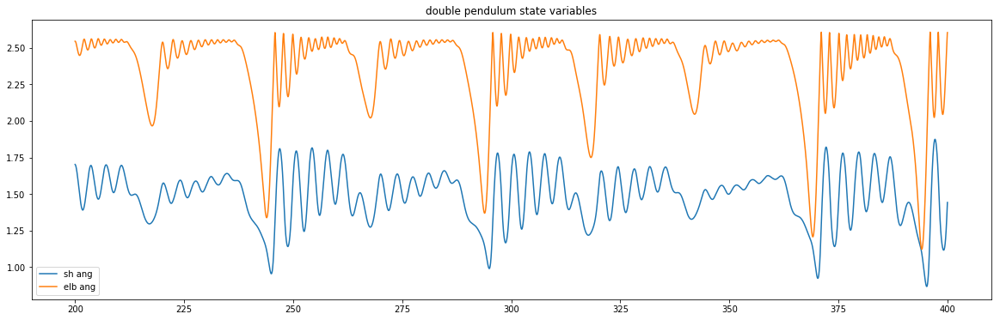

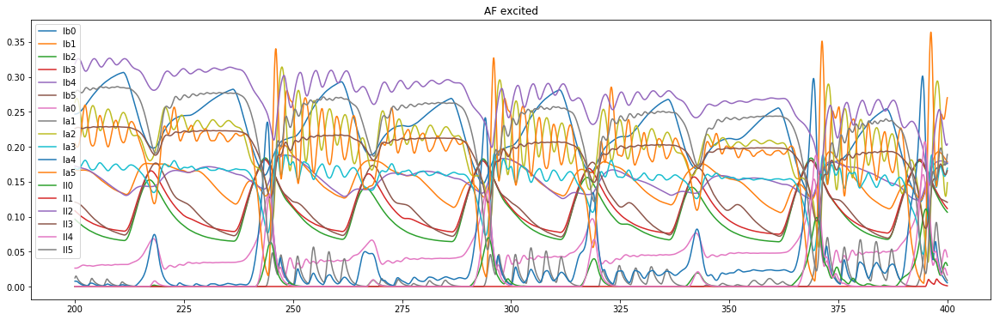

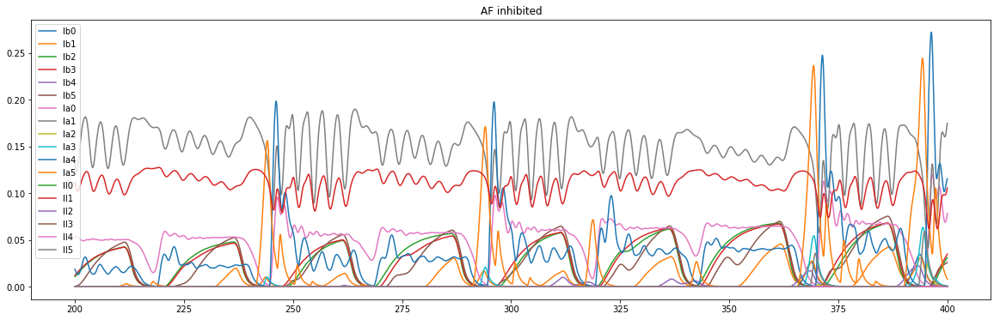

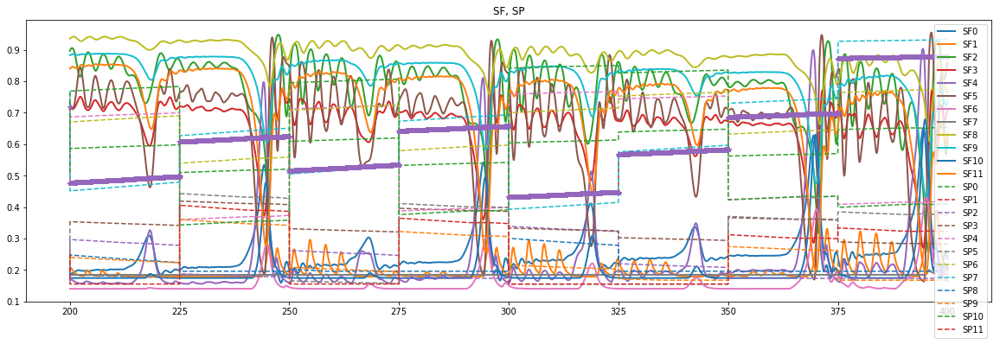

SF = 
[0.23451861 0.19450425 0.61903294 0.71200928 0.16464123 0.85900059
 0.20120289 0.18593608 0.76729315 0.73826688 0.20391819 0.63682702]
SP = 
[0.65334708 0.87772307 0.17328104 0.28212748 0.418632   0.3742038
 0.77347578 0.93167394 0.19585579 0.16728396 0.40985734 0.32181886]


In [17]:
# P
P_fig = plt.figure(figsize=fs)
P_state = plant_data[P][:,0:4:2]
plt.plot(times, P_state)
#plt.legend(['sh ang', 'sh ang vel', 'elb ang', 'elb ang vel'])
plt.legend(['sh ang', 'elb ang',])
plt.title('double pendulum state variables')
print("shoulder angle: %f, shoulder vel: %f" % (P_state[-1,0],P_state[-1,1]))

# AF plus
AFe_fig = plt.figure(figsize=fs)
AFe_data = np.array(data[AF[0:18]])
plt.plot(times, AFe_data.transpose())
AF_legends = ['Ib' + str(i) for i in range(6)] + \
             ['Ia' + str(i) for i in range(6)] + \
             ['II' + str(i) for i in range(6)]
plt.legend(AF_legends)
plt.title('AF excited')
print('AFe_data:')
print(AFe_data[:,-1])

# AF minus
AFi_fig = plt.figure(figsize=fs)
AFi_data = np.array(data[AF[18:36]])
plt.plot(times, AFi_data.transpose())
AF_legends = ['Ib' + str(i) for i in range(6)] + \
             ['Ia' + str(i) for i in range(6)] + \
             ['II' + str(i) for i in range(6)]
plt.legend(AF_legends)
plt.title('AF inhibited')
print('AFi_data:')
print(AFi_data[:,-1])

# SF, SP
SF_fig = plt.figure(figsize=fs)
SF_data = np.array(data[SF])
SP_data = np.array(data[SP])
plt.plot(times, SF_data.transpose(), linewidth=2)
plt.plot(times, SP_data.transpose(), '--')
plt.plot(times, SP_data[1,:], '*')
SF_legends = ['SF'+str(i) for i in range(len(SF))]
SP_legends = ['SP'+str(i) for i in range(len(SP))]
plt.legend(SF_legends+SP_legends)
plt.title('SF, SP')
plt.show()
print('SF = ')
print(SF_data[:,-1])
print('SP = ')
print(SP_data[:,-1])

In [24]:
# extracting afferent means
Ia_means = np.zeros(6)
II_means = np.zeros(6)
Ib_means = np.zeros(6)
for m in range(6):
    Ia_means[m] = np.mean(arm_activs[:,28+m])
    II_means[m] = np.mean(arm_activs[:,34+m])
    Ib_means[m] = np.mean(arm_activs[:,22+m])
print(Ia_means)
print(II_means)
print(Ib_means)

[ 0.13493085  0.12699591  0.13034749  0.06348308  0.23278596 -0.02502041]
[0.3317177  0.26290762 0.26859266 0.21690979 0.40901287 0.08413031]
[0.06734463 0.06212599 0.08832295 0.13052798 0.06396478 0.11577913]


In [10]:
AF_avgs

array([0.24, 0.1 , 0.64, 0.31, 0.43, 0.2 , 0.24, 0.11, 0.43, 0.29, 0.3 ,
       0.17])

In [71]:
# removing feedback to compare with Fink et al.
for uid in CE+CI:
    syn_list = net.syns[uid]
    for syn in syn_list:
        if syn.preID in AF:
            #syn.w = 0.
            syn.alpha = 1.
            syn.normalize = False